**Data Loading & Configuration:**

In [0]:
# NOTE:
# SAS token is NOT included in the repository.
# Users must provide their own credentials to access the data.
# config
storage_account = "lab94290"
container = "airbnb"
user_email = "edaniel@campus.technion.ac.il"
base_path = f"file:/Workspace/Users/{user_email}/"

# SAS Token configuration
sas_token = "Put the SAS token here"
sas_token = sas_token.lstrip('?')

spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", sas_token)

path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/airbnb_1_12_parquet"
airbnb_df = spark.read.parquet(path)

In [0]:
%pip install gensim

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


**Loading and Broadcasting Pre-trained Word Embeddings (GloVe)**

In [0]:
import gensim.downloader as api
import numpy as np

# Downloading the model from Gensim servers
print("Downloading Word2Vec model...")
w2v_model = api.load("glove-wiki-gigaword-100") 
print("Model loaded successfully!")

# Broadcast the model to all workers in the cluster
bc_w2v_model = spark.sparkContext.broadcast(w2v_model)

Model loaded successfully!


In [0]:
# Loading all files from the list in the image

# List of all cities that appear in your Workspace
cities = [
    "barcelona", "budapest", "buenos_aires", "cape_town", 
    "lisbon", "mexico_city", "miami", "new_york", 
    "paris", "phuket", "san_francisco", "sau_paulo", 
    "tel_aviv", "tiberias", "tokyo"
]

# A dictionary that will contain all the DataFrames (so you don't have to manually define a variable for each one)
dfs = {}

for city in cities:
    file_path = f"{base_path}{city}_final.csv"
    try:
        dfs[city] = (spark.read.format("csv")
                      .option("header", "true")
                      .option("inferSchema", "true")
                      .load(file_path))
        print(f"Successfully loaded: {city}")
    except Exception as e:
        print(f"Error loading {city}: {e}")

# Now you can access any DataFrame conveniently, for example: dfs['tel_aviv'].show()
print(f"\nTotal cities loaded: {len(dfs)}")

Successfully loaded: barcelona
Successfully loaded: budapest
Successfully loaded: buenos_aires
Successfully loaded: cape_town
Successfully loaded: lisbon
Successfully loaded: mexico_city
Successfully loaded: miami
Successfully loaded: new_york
Successfully loaded: paris
Successfully loaded: phuket
Successfully loaded: san_francisco
Successfully loaded: sau_paulo
Successfully loaded: tel_aviv
Successfully loaded: tiberias
Successfully loaded: tokyo

Total cities loaded: 15


**Data Collection Distribution by Number of Locations:**

Successfully processed: barcelona
Successfully processed: budapest
Successfully processed: buenos_aires
Successfully processed: cape_town
Successfully processed: lisbon
Successfully processed: mexico_city
Successfully processed: miami
Successfully processed: new_york
Successfully processed: paris
Successfully processed: phuket
Successfully processed: san_francisco
Successfully processed: sau_paulo
Successfully processed: tel_aviv
Successfully processed: tiberias
Successfully processed: tokyo


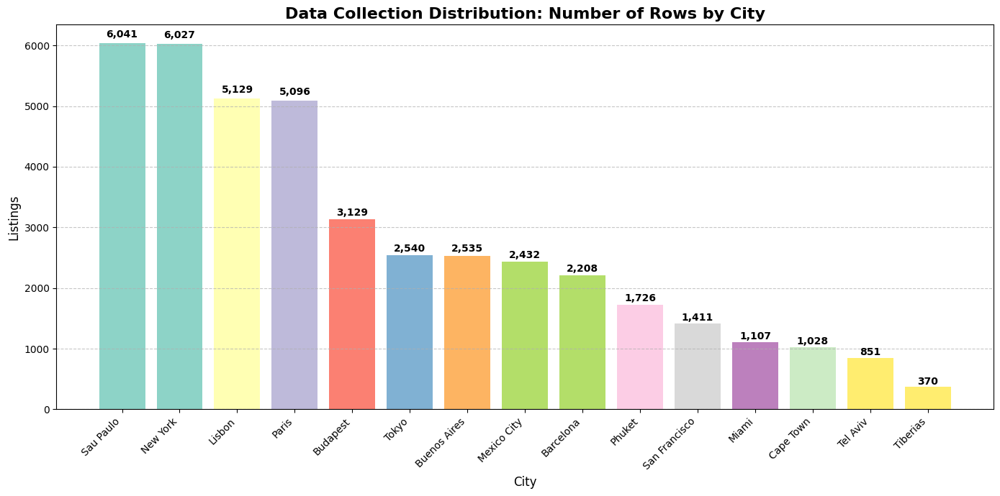

city_source,count
Sau Paulo,6041
New York,6027
Lisbon,5129
Paris,5096
Budapest,3129
Tokyo,2540
Buenos Aires,2535
Mexico City,2432
Barcelona,2208
Phuket,1726


In [0]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
from pyspark.sql import functions as F

# 1. Setting up the list of cities 
cities = [
    "barcelona", "budapest", "buenos_aires", "cape_town", 
    "lisbon", "mexico_city", "miami", "new_york", 
    "paris", "phuket", "san_francisco", "sau_paulo", 
    "tel_aviv", "tiberias", "tokyo"
]

combined_df = None

for city in cities:
    file_path = f"{base_path}{city}_final.csv"
    try:
        df = (spark.read.format("csv")
              .option("header", "true")
              .option("inferSchema", "true")
              .option("multiLine", "true")  # Important for reviews with entries
              .option("escape", '"')        # Important for handling quotation marks within text
              .option("quote", '"')
              .load(file_path))
        
        # Unifying column names: If the city uses the lat/long abbreviation, we will convert to the full name
        if "lat" in df.columns:
            df = df.withColumnRenamed("lat", "latitude")
        if "long" in df.columns:
            df = df.withColumnRenamed("long", "longitude")
            
        # Remove junk columns created by read errors 
        bad_cols = [c for c in df.columns if c.startswith("_c")]
        df = df.drop(*bad_cols)
        
        # Adding the source column
        temp_df = df.withColumn("city_source", F.lit(city.replace("_", " ").title()))
        
        if combined_df is None:
            combined_df = temp_df
        else:
            # Using unionByName ensures that the columns are joined by name and not by position
            combined_df = combined_df.unionByName(temp_df, allowMissingColumns=True)
            
        print(f"Successfully processed: {city}")
    except Exception as e:
        print(f"Error loading {city}: {e}")

# 2. Calculating statistics for a graph
stats_df = combined_df.groupBy("city_source").count().toPandas()
stats_df = stats_df.sort_values(by="count", ascending=False)

# 3. Creating the graph
plt.figure(figsize=(14, 7))
colors = plt.cm.Set3(np.linspace(0, 1, len(stats_df)))

bars = plt.bar(stats_df['city_source'], stats_df['count'], color=colors)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + (yval*0.01), 
             f'{int(yval):,}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title('Data Collection Distribution: Number of Rows by City', fontsize=16, fontweight="bold")
plt.xlabel('City', fontsize=12)
plt.ylabel('Listings', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

plt.show()
display(combined_df.groupBy("city_source").count().orderBy(F.desc("count")))

**External Review Text Analysis:**

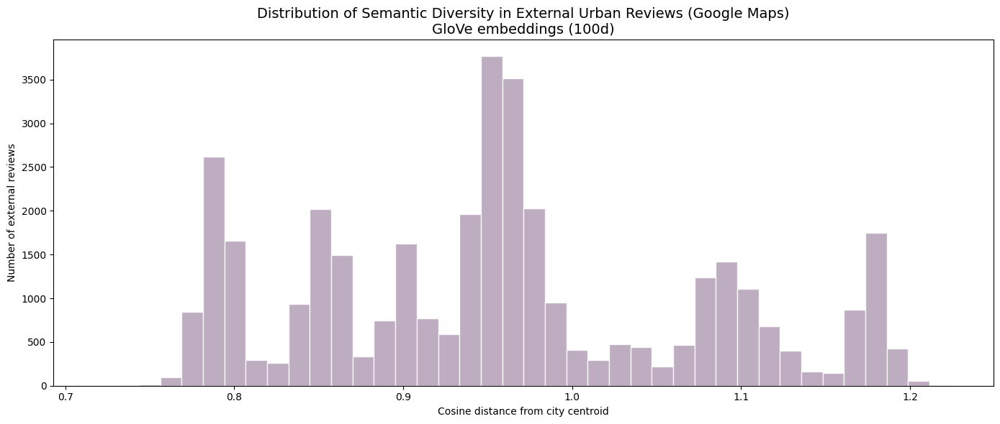

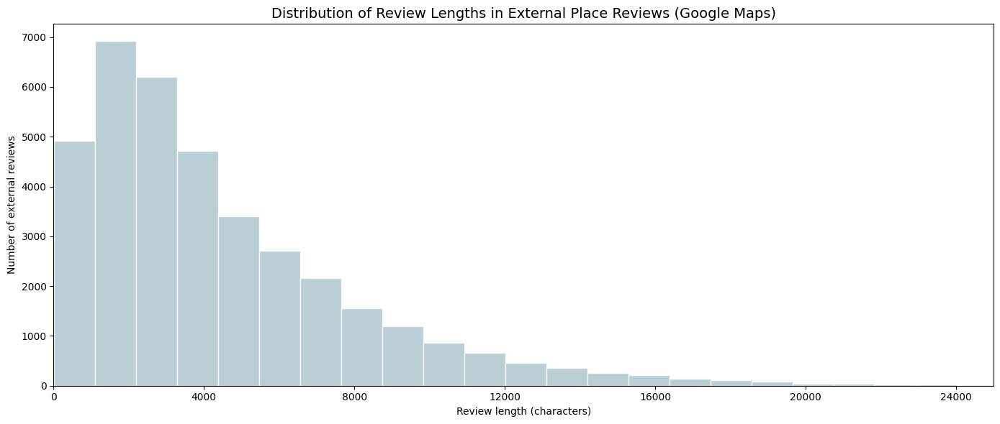

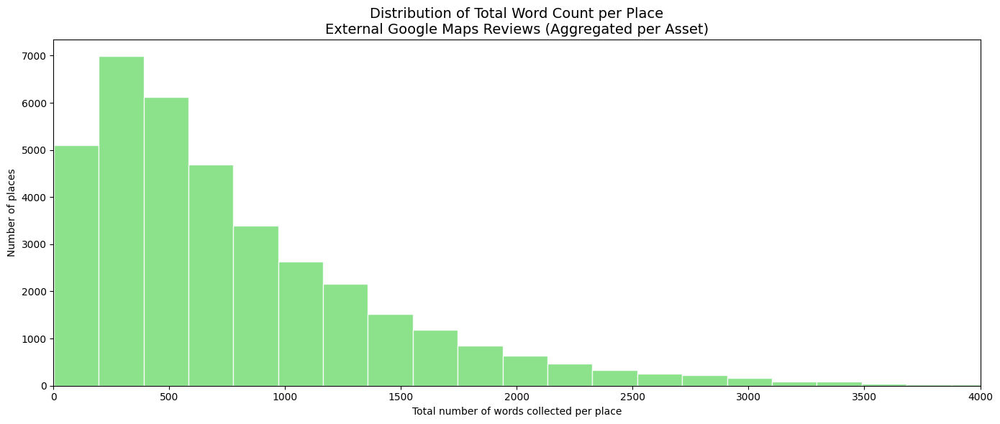

In [0]:
# SEMANTIC, LENGTH & WORD-COUNT DISTRIBUTION OF EXTERNAL REVIEWS
# Google Maps place reviews | GloVe (100d) | combined_df

import re
import numpy as np
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql.types import ArrayType, FloatType, DoubleType, IntegerType

# 1) Review → GloVe embedding (External reviews)
def tokenize(text):
    if text is None:
        return []
    return re.findall(r"[a-z]+", text.lower())

def review_to_vec(text):
    model = bc_w2v_model.value
    tokens = tokenize(text)
    vecs = [model[t] for t in tokens if t in model]
    if not vecs:
        return [0.0] * 100
    return np.mean(vecs, axis=0).astype(float).tolist()

review_vec_udf = F.udf(review_to_vec, ArrayType(FloatType()))

df = combined_df.withColumn(
    "review_vec",
    review_vec_udf(F.col("reviews_content"))
)

# 2) Review length (characters)
df = df.withColumn(
    "review_length",
    F.length(F.col("reviews_content"))
)

# 3) Word count per place (total words collected per asset)
def word_count(text):
    if text is None:
        return 0
    return len(re.findall(r"[a-zA-Z]+", text))

word_count_udf = F.udf(word_count, IntegerType())

df = df.withColumn(
    "review_word_count",
    word_count_udf(F.col("reviews_content"))
)

# 4) City-level semantic centroid
centroid_df = (
    df
    .select("city_source", "review_vec")
    .select(
        "city_source",
        F.posexplode("review_vec").alias("idx", "val")
    )
    .groupBy("city_source", "idx")
    .agg(F.avg("val").alias("val"))
    .groupBy("city_source")
    .agg(F.collect_list("val").alias("centroid_vec"))
)

# 5) Cosine distance from centroid (semantic diversity)
def cosine_distance(vec, centroid):
    if vec is None or centroid is None:
        return None
    v = np.array(vec)
    c = np.array(centroid)
    nv = np.linalg.norm(v)
    nc = np.linalg.norm(c)
    if nv == 0 or nc == 0:
        return None
    return float(1 - np.dot(v, c) / (nv * nc))

cosine_dist_udf = F.udf(cosine_distance, DoubleType())

df = (
    df.join(centroid_df, on="city_source", how="left")
      .withColumn(
          "semantic_distance",
          cosine_dist_udf(F.col("review_vec"), F.col("centroid_vec"))
      )
      .filter(F.col("semantic_distance").isNotNull())
)

# 6) Collect to Pandas for plotting
pdf = df.select(
    "semantic_distance",
    "review_length",
    "review_word_count"
).toPandas()

# Graph 1 - Semantic Gaiwan (External / Google Maps)
plt.figure(figsize=(14, 6))
plt.hist(
    pdf["semantic_distance"],
    bins=40,
    color="#B39EB5",   
    alpha=0.85,
    edgecolor="white"
)
plt.xlabel("Cosine distance from city centroid")
plt.ylabel("Number of external reviews")
plt.title(
    "Distribution of Semantic Diversity in External Urban Reviews (Google Maps)\n"
    "GloVe embeddings (100d)",
    fontsize=14
)
plt.tight_layout()
plt.show()

from matplotlib.ticker import MaxNLocator

# Graph 2 - Review length distribution (characters)
plt.figure(figsize=(14, 6))

plt.hist(
    pdf["review_length"],
    bins=40,
    color="#AEC6CF",
    alpha=0.85,
    edgecolor="white"
)

plt.xlabel("Review length (characters)")
plt.ylabel("Number of external reviews")
plt.title(
    "Distribution of Review Lengths in External Place Reviews (Google Maps)",
    fontsize=14
)

# Fix x axis
ax = plt.gca()
ax.set_xlim(0, 25000)
ax.xaxis.set_major_locator(MaxNLocator(nbins=8, integer=True))
ax.set_xlim(left=0)

plt.tight_layout()
plt.show()


# Graph 3 — total word count per place 
plt.figure(figsize=(14, 6))
plt.hist(
    pdf["review_word_count"],
    bins=40,
    color="#77DD77",    
    alpha=0.85,
    edgecolor="white"
)

plt.xlabel("Total number of words collected per place")
plt.ylabel("Number of places")
plt.title(
    "Distribution of Total Word Count per Place\n"
    "External Google Maps Reviews (Aggregated per Asset)",
    fontsize=14
)
ax = plt.gca()
ax.set_xlim(0, 4000)
plt.tight_layout()
plt.show()

**Distribution of Listing Rating Categories by City:**

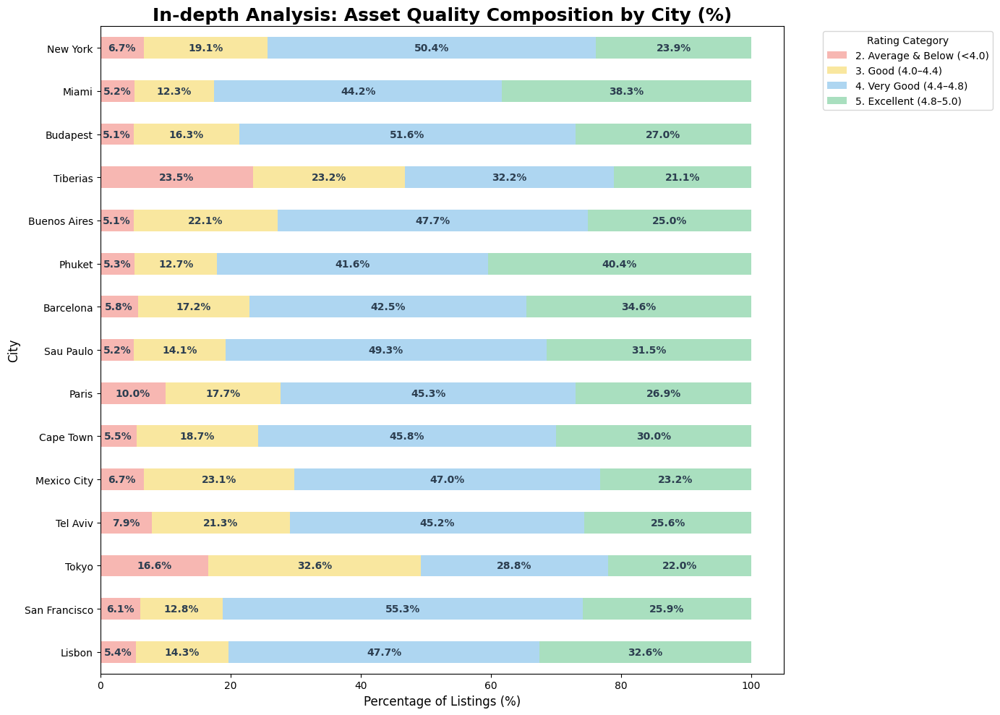

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import pandas as pd

# 1. Creating quality categories in Spark
categorized_df = combined_df.withColumn(
    "rating_category", 
    F.when(F.col("rating") >= 4.8, "5. Excellent (4.8–5.0)")
     .when(F.col("rating") >= 4.4, "4. Very Good (4.4–4.8)")
     .when(F.col("rating") >= 4.0, "3. Good (4.0–4.4)")
     .otherwise("2. Average & Below (<4.0)")
)

# 2. Calculate percentage distribution for each city
pivot_df = (
    categorized_df
    .groupBy("city_source")
    .pivot("rating_category")
    .count()
    .fillna(0)
)

# Convert to Pandas and calculate percentages
pdf = pivot_df.toPandas().set_index("city_source")
pdf_percent = pdf.div(pdf.sum(axis=1), axis=0) * 100

# 3. Visualization: Stacked Horizontal Bar Chart 
pastel_colors = ['#f7b7b2', '#f9e79f', '#aed6f1', '#a9dfbf']

ax = pdf_percent.plot(
    kind='barh',
    stacked=True,
    figsize=(14, 10),
    color=pastel_colors
)

# Graph design
plt.title(
    'In-depth Analysis: Asset Quality Composition by City (%)',
    fontsize=18,
    fontweight='bold'
)
plt.xlabel('Percentage of Listings (%)', fontsize=12)
plt.ylabel('City', fontsize=12)

plt.legend(
    title="Rating Category",
    bbox_to_anchor=(1.05, 1),
    loc='upper left'
)

# Adding percentages inside bars
for p in ax.patches:
    width = p.get_width()
    if width > 5:
        ax.annotate(
            f'{width:.1f}%',
            (p.get_x() + width / 2, p.get_y() + 0.25),
            ha='center',
            va='center',
            fontsize=10,
            fontweight='bold',
            color='#2c3e50'
        )

plt.tight_layout()
plt.show()

**Organizing and Cleaning External Data:**

In [0]:
from pyspark.sql.functions import lit

# List of all cities
cities = [
    "barcelona", "budapest", "buenos_aires", "cape_town", 
    "lisbon", "mexico_city", "miami", "new_york", 
    "paris", "phuket", "san_francisco", "sau_paulo", 
    "tel_aviv", "tiberias", "tokyo"
]

all_dfs = []

for city in cities:
    file_path = f"{base_path}{city}_final.csv"
    try:
        # 1. loading
        df = (spark.read.format("csv")
              .option("header", "true")
              .option("inferSchema", "true")
              .load(file_path))
        
        # 2. Cleaning up unnecessary columns
        # I added a check so it doesn't crash if the column doesn't exist in one of the cities
        cols_to_drop = ["_c8", "_c9", "_c10", "_c11", "_c12", "_c13", "_c14"]
        df = df.drop(*cols_to_drop)
        
        # 3. City tagging
        display_name = city.replace("_", " ").title()
        df = df.withColumn("source_city", lit(display_name))
        
        all_dfs.append(df)
        print(f"Successfully processed: {display_name}")
        
    except Exception as e:
        print(f"Error processing {city}: {e}")

# 4. Union all cities into one table (instead of the long unionByName)
if all_dfs:
    external_df = all_dfs[0]
    for next_df in all_dfs[1:]:
        external_df = external_df.unionByName(next_df, allowMissingColumns=True)

    print(f"\nTotal rows across all cities: {external_df.count()}")
    display(external_df.limit(10))

Successfully processed: Barcelona
Successfully processed: Budapest
Successfully processed: Buenos Aires
Successfully processed: Cape Town
Successfully processed: Lisbon
Successfully processed: Mexico City
Successfully processed: Miami
Successfully processed: New York
Successfully processed: Paris
Successfully processed: Phuket
Successfully processed: San Francisco
Successfully processed: Sau Paulo
Successfully processed: Tel Aviv
Successfully processed: Tiberias
Successfully processed: Tokyo

Total rows across all cities: 42258


place_name url category rating num_of_reviews reviews_content latitude longitude source_city lat long Manihi Escola de Surf https://www.google.com/maps/place/Manihi+Escola+de+Surf/@41.3874,2.1686,14z/data=!4m11!1m3!2m2!1sSurf+school+in+El+Raval,+Barcelona,+Spain!6e1!3m6!1s0x12a4a3a972c610f5:0x7232cb24a8ba1960!8m2!3d41.3773939!4d2.1904444!15sCilTdXJmIHNjaG9vbCBpbiBFbCBSYXZhbCwgQmFyY2Vsb25hLCBTcGFpblopIidzdXJmIHNjaG9vbCBpbiBlbCByYXZhbCBiYXJjZWxvbmEgc3BhaW6SAQtzdXJmX3NjaG9vbJoBJENoZERTVWhOTUc5blMwVkpRMEZuU1VSR00zTkhkSEpCUlJBQuABAPoBBQiOARAv!16s%2Fg%2F11dzt207cj?hl=en&entry=ttu&g_ep=EgoyMDI2MDEwNy4wIKXMDSoASAFQAw%3D%3D Wellness_Lifestyle 4.6 33 We did the sunrise stand up paddling. It was well organized and overall a great experience. I would totally recommend! || While waking up can be brutal it was worth it to try out SUP at 6 in the morning to see the sun come up. The instructors check on you and give you some pointers if you are new to SUP paddling. 100% recommended. Instructions are in English and Spanish when needed || Highly recommend the sunrise paddleboarding! I joined the group as a solo traveler and had a great time. It's an unforgettable experience, and our guide, Ale, took amazing pictures too! || What a magical experience! I highly recommend a sunrise paddle — such an uplifting and energizing way to start your day. ✨ Ana was lovely, and the photos were fantastic || I came back after a while, the guy welcomed me super nice🩵 (don’t know the name, he was finishing shift) I went for sup, in my humble opinion the board could have more air, nether the less while o got back and gave a feedback 3 boys (fat cats) were smiling and just commenting in Spanish. Well not best experience. Two stars :🌟 for a guy who works there very long and was welcoming me. 🌟 for waves in barceloneta & wind! || Beautiful sunrise SUP ❤️ Ana was a brilliant instructor || One year ago, we experienced a distressing incident at this establishment, where we were unfortunately robbed of our essential belongings such as IDs, cellphones, ATM cards, and more. Picture this: you have an upcoming flight and you've lost the rest of your travel essentials, leaving you stranded and helpless, resembling a beggar without a single possession. This ordeal not only cost us financially but also resulted in the loss of valuable clients who couldn't reach us. And let's not forget the hassle of obtaining new IDs and updating contact information across all our accounts. What happened here, is that the establishment had encouraged us to entrust our smaller bag with valuables to their receiving desk, assuring us it was a safer option than leaving them in their common area. It seemed reasonable, especially as we were heading for a day of surfing, making it impossible to take our important items into the water. However, when our bag went mysteriously missing, their response was astonishingly disappointing. They simply explained that the bag might have been stolen from their receiving desk or perhaps mistakenly handed to another customer. They disclaimed any responsibility for the lost items within their premises. There was no system for securely storing our belongings, all the security cameras were conveniently non-functional, raising suspicions, and the staff exhibited an alarming lack of cooperation and concern for our predicament. To validate this claim, here is a picture of the translated police report. So, is it our mistake to PLACE TRUST in this establishment as their CUSTOMERS? || I booked and PAID for a sunrise paddle on a specific date — only to be told the night before that it was not possible. Instead, they offered Friday as an alternative, a date that didn’t work for me at all. I immediately asked for a refund, and to this day I still haven’t received my €50 back. This is beyond unprofessional, it’s theft. You can’t just take people’s money and disappear. || First time ever on a surfboard and these guys were ace! Gabriel my instructor was a great teacher; the surfb

**Internal Data Preparation: Cleaning, Filtering, and Parsing:**

In [0]:
from pyspark.sql.functions import col, from_json, size, explode, avg, when, flatten, array_distinct
from pyspark.sql.types import ArrayType, StringType, StructType, StructField, DoubleType, IntegerType

# 1. Loading and selecting columns (Selection)
relevant_cols = [
    'listing_name', 'price', 'url', 'image', 'lat', 'long', 
    'description', 'reviews', 'ratings', 'amenities', 
    'category', 'guests', 'pets_allowed', 'is_supperhost', 
    'host_rating', 'property_number_of_reviews', 'highlights', 'house_rules',
    'listing_title', 'location', 'total_price'
]

existing_cols = [c for c in relevant_cols if c in airbnb_df.columns]
internal_df = airbnb_df.select(*existing_cols)

# 2. Cleaning
internal_df = internal_df.dropDuplicates()
internal_df = internal_df.dropna(subset=['listing_name', 'lat', 'long', 'reviews'])

# 3. Type Casting
double_cols = ['price', 'lat', 'long', 'ratings', 'host_rating', 'total_price']
for c in double_cols:
    if c in internal_df.columns:
        internal_df = internal_df.withColumn(c, col(c).cast("double"))

int_cols = ['guests', 'property_number_of_reviews']
for c in int_cols:
    if c in internal_df.columns:
        internal_df = internal_df.withColumn(c, col(c).cast("int"))

# 4. Geographic Filtering:
# Defining the boundaries for each city
city_bounds = {
    "Paris": [48.80, 48.92, 2.20, 2.48],
    "Budapest": [47.40, 47.65, 18.90, 19.35],
    "New York": [40.48, 40.92, -74.26, -73.69],
    "Barcelona": [41.30, 41.47, 2.05, 2.25],
    "Buenos Aires": [-34.71, -34.52, -58.54, -58.33],
    "Sau Paulo": [-23.75, -23.35, -46.85, -46.35],
    "Cape Town": [-34.36, -33.45, 18.30, 19.00],
    "Lisbon": [38.68, 38.80, -9.25, -9.09],
    "Mexico City": [19.10, 19.60, -99.40, -98.90],
    "Miami": [25.70, 25.95, -80.35, -80.10],
    "Phuket": [7.70, 8.25, 98.20, 98.50],
    "San Francisco": [37.70, 37.85, -122.55, -122.35],
    "Tel Aviv": [32.00, 32.15, 34.72, 34.85],
    "Tiberias": [32.75, 32.85, 35.50, 35.60],
    "Tokyo": [35.50, 35.85, 139.50, 140.00]
}

city_column_expr = None

for city, bounds in city_bounds.items():
    lat_min, lat_max, lon_min, lon_max = bounds
    
    # Is the property located within the boundaries of this city?
    is_in_city = (
        (col("lat") > lat_min) & (col("lat") < lat_max) &
        (col("long") > lon_min) & (col("long") < lon_max)
    )
    
    if city_column_expr is None:
        city_column_expr = when(is_in_city, city)
    else:
        city_column_expr = city_column_expr.when(is_in_city, city)

# Update the DataFrame: Add the column and filter rows without city
# Use the same internal_df variable to maintain consistency
internal_df = internal_df.withColumn("source_city", city_column_expr) \
                         .filter(col("source_city").isNotNull())

print(f"Rows after city filtering: {internal_df.count()}")

# 5. Reviews Filtering
if 'property_number_of_reviews' in internal_df.columns:
    internal_df = internal_df.filter(col("property_number_of_reviews") >= 70)

# 6. Parsing & Flattening:
# Defining agreements
amenities_schema = ArrayType(StructType([
    StructField("group_name", StringType(), True),
    StructField("items", ArrayType(StructType([
        StructField("name", StringType(), True),
        StructField("value", StringType(), True)
    ])), True)
]))

highlights_schema = ArrayType(StructType([
    StructField("name", StringType(), True),
    StructField("value", StringType(), True)
]))

reviews_schema = ArrayType(StringType())

# 6.1. Amenities
if 'amenities' in internal_df.columns:
    internal_df = internal_df.withColumn("amenities_struct", from_json(col("amenities"), amenities_schema))
    internal_df = internal_df.withColumn("amenities_list", array_distinct(flatten(col("amenities_struct.items.name"))))

# 6.2. Highlights
if 'highlights' in internal_df.columns:
    internal_df = internal_df.withColumn("highlights_struct", from_json(col("highlights"), highlights_schema))
    internal_df = internal_df.withColumn("highlights_list", col("highlights_struct.name"))

# 6.3. Reviews
if 'reviews' in internal_df.columns:
    internal_df = internal_df.withColumn("reviews", from_json(col("reviews"), reviews_schema))

# 7. Checking the final result
print(f"Final listing count: {internal_df.count()}")
display(internal_df.limit(10))

Rows after city filtering: 90163
Final listing count: 17471


listing_name price url image lat long description reviews ratings amenities category guests pets_allowed is_supperhost host_rating property_number_of_reviews highlights house_rules listing_title location total_price source_city amenities_struct amenities_list highlights_struct highlights_list Entire condo in Miami Beach, Florida, United States null https://www.airbnb.ca/rooms/31239067?currency=USD&guests=1 https://a0.muscache.com/pictures/6836e48f-bf93-4e16-a482-8cab1df7919c.jpg 25.83585 -80.12096 This 16th floor unit is a comfortable 2 bedroom 2 bath beachfront condominium located on the portion of Miami Beach referred to as 'Mid-Beach'. The building is centrally located between North Beach and South Beach making it a perfect location for those desiring a less crowded beach yet close enough for shopping and night life.Guest accessGuests have access to the building’s pool, gym*, and recreation room. Beach lounge chairs are available on the beach on a first come basis.We do not provide refunds for any common amenities that are not available due to circumstances beyond our control due to emergency or maintenance.Other things to notePackage Deliveries:Be informed that, due to the high volume of packages that Valet is receiving, the schedule and procedures have been modified for the benefit of the building Community. Effective Saturday, October 9, 2021. NEW PACKAGE SCHEDULE Monday to Friday from 12 PM to 8 PMSaturdays and Sundays from 8 AM-10 AM and 4 PM-6 PM.**Rates are subject to change**$5.00 per standard size packageLess than thirteen (13) inches.(Any packages where all dimensions, length, width or depth are individually).$10.00 per oversized packageExceeds thirteen (13) inches (Any package where at least one dimension, length, width or depth).Payment Methods-cash or credit card After-hours pick-up fee will be of $25.00Packages not collected within fifteen (15) days will be returned to the carrier, and if the carrier does not accept the return, the Association will dispose of them after ninety (90) days, unless other arrangements are made with Valet. The Association will not accept any responsibility for deliveries of flowers, food, medicines, fragile items, damage or loss of any mail item or any delivery.Registration number002298042017, 2057111 List(Our stay was great overall, but the check-in and first day were very stressful. We arrived at 11 PM with our 10-month-old baby, only to find no keys in the lockbox. There was no phone number to call host, just Airbnb messaging. Thankfully, the building security helped us get a spare key. When we entered the unit we realized it hadn’t been cleaned after the previous guests. Given the late hour, we stayed and used clean sheets we found in the closet to make the beds ourselves. The host responded the next morning and offered a partial refund. A cleaner came at 11 AM but stayed for 5! hours, which made it really difficult to settle in. Despite the rough start, we enjoyed the rest of our stay—the views from the balcony were stunning, the kitchen had everything we needed, and the crib and highchair were a big help with the baby. Having a parking spot (valet-style) was also a big plus for us., 1, this unit was absolutely stunning! clean and comfortable!! my one complaint is that the photos do not demonstrate that the second bedroom is very small and has absolutely no windows, which was inconvenient. Overall, I would recommend this Airbnb but make sure you know it's a bedroom and a half., We stayed last year and enjoyed the condo so decided to stay there again this year. Great value and a great place to stay. Excellent view and beach. Pool heater was not working this year so that was a little disappointing. Also, check in was 3:00 but cleaning lady was in there until about 4:00. Not a big deal. She let us come in and we relaxed on the balcony until she was finished. Overall, great place to stay! If we head to Miami Beach next year, would definitely stay here again., Great stay , can't wai

**Internal Airbnb Data EDA:**

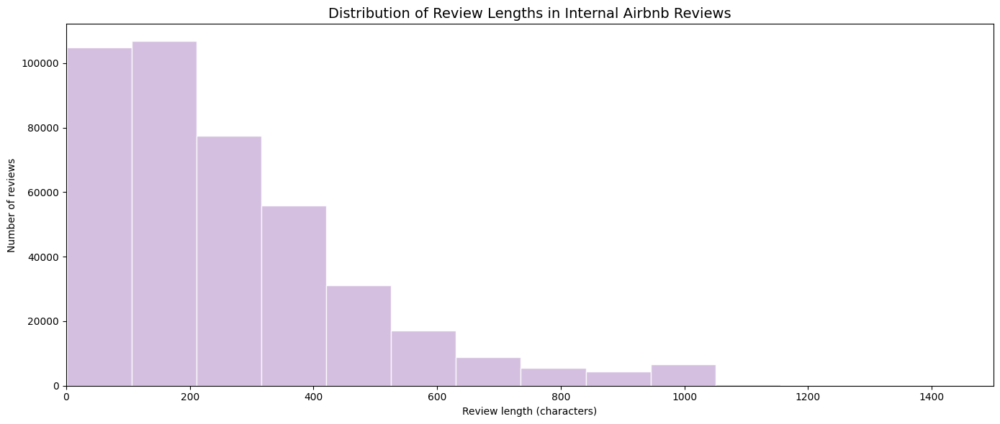

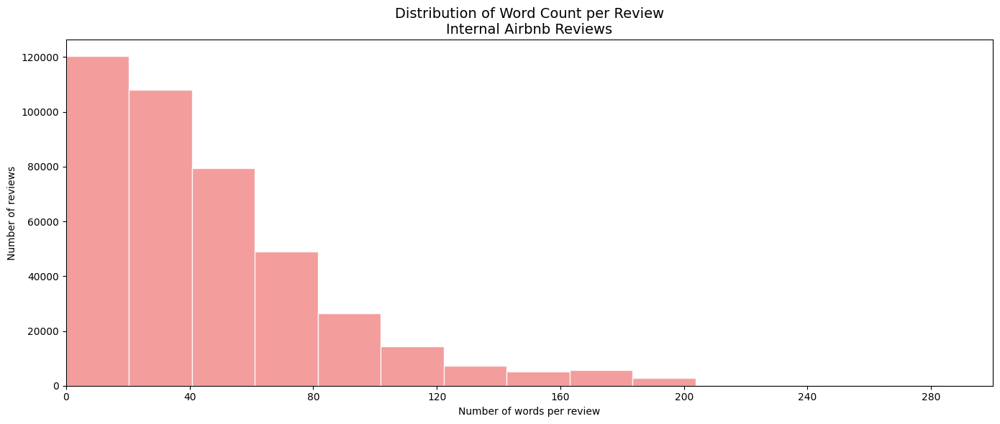

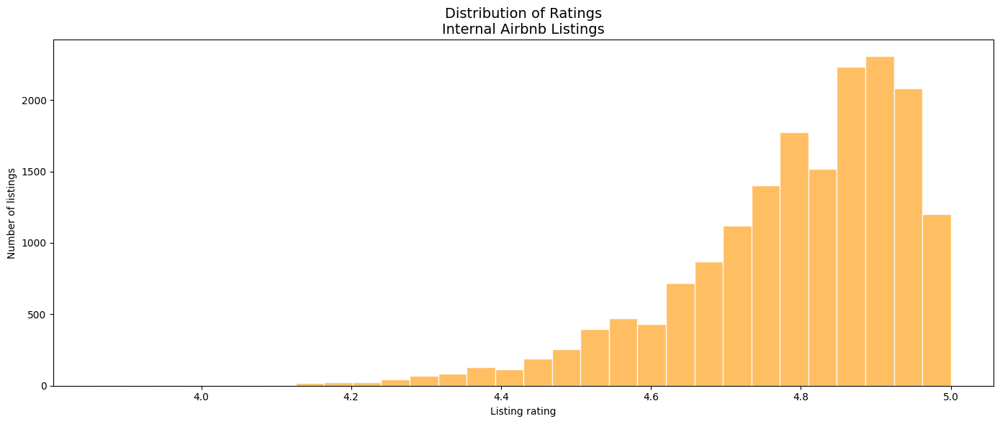

In [0]:
# INTERNAL DATA — EDA
# Airbnb Listings | Reviews, Length, Word Count, Ratings
import re
import numpy as np
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql.types import IntegerType
from matplotlib.ticker import MaxNLocator

# 1) Flatten reviews array - one review fer row 
# reviews is an array to explode for text-based EDA
reviews_df = (
    internal_df
    .withColumn("review_text", F.explode_outer("reviews"))
    .filter(F.col("review_text").isNotNull())
)

# 2) Review length (characters)
reviews_df = reviews_df.withColumn(
    "review_length",
    F.length(F.col("review_text"))
)

# 3) Word count per review 
def word_count(text):
    if text is None:
        return 0
    return len(re.findall(r"[a-zA-Z]+", text))

word_count_udf = F.udf(word_count, IntegerType())

reviews_df = reviews_df.withColumn(
    "review_word_count",
    word_count_udf(F.col("review_text"))
)

# 4) Select data for plotting 
pdf_reviews = reviews_df.select(
    "review_length",
    "review_word_count"
).toPandas()

pdf_listings = internal_df.select(
    "property_number_of_reviews",
    "ratings"
).toPandas()

# Graph 1 - Review Length Distribution 
plt.figure(figsize=(14, 6))

plt.hist(
    pdf_reviews["review_length"],
    bins=40,
    color="#CDB4DB",
    alpha=0.85,
    edgecolor="white"
)

plt.xlabel("Review length (characters)")
plt.ylabel("Number of reviews")
plt.title(
    "Distribution of Review Lengths in Internal Airbnb Reviews",
    fontsize=14
)

ax = plt.gca()
ax.set_xlim(0, 1500)
ax.xaxis.set_major_locator(MaxNLocator(nbins=8, integer=True))
ax.set_xlim(left=0)

plt.tight_layout()
plt.show()

# Graph 2 - word count per review (internal) 
plt.figure(figsize=(14, 6))

plt.hist(
    pdf_reviews["review_word_count"],
    bins=40,
    color="#F28C8C",
    alpha=0.85,
    edgecolor="white"
)

plt.xlabel("Number of words per review")
plt.ylabel("Number of reviews")
plt.title(
    "Distribution of Word Count per Review\nInternal Airbnb Reviews",
    fontsize=14
)

ax = plt.gca()
ax.set_xlim(0, 300)
ax.xaxis.set_major_locator(MaxNLocator(nbins=8, integer=True))
ax.set_xlim(left=0)

plt.tight_layout()
plt.show()

# Graph 4 — ratings distiburation 
plt.figure(figsize=(14, 6))

plt.hist(
    pdf_listings["ratings"].dropna(),
    bins=30,
    color="#FFB347",
    alpha=0.85,
    edgecolor="white"
)

plt.xlabel("Listing rating")
plt.ylabel("Number of listings")
plt.title(
    "Distribution of Ratings\nInternal Airbnb Listings",
    fontsize=14
)

ax = plt.gca()
ax.xaxis.set_major_locator(MaxNLocator(nbins=8))

plt.tight_layout()
plt.show()

**Persona-Oriented Textual Dictionary for Review & Description Matching:**

In [0]:

# Embedded dictionary: Persona-oriented lexicon for matching free-text to persona needs
# Structure: source_type to persona to polarity (positive/negative) - list of phrases
user_text_lexicons = {
    # 1) PROPERTY REVIEWS
    # Guest reviews about the Airbnb property itself (inside the listing).
    # Used to capture "in-unit" experience signals: noise, cleanliness, amenities, comfort, Wi-Fi, etc.
    'property_reviews': {
        # Persona: Singles
        # Focus: social vibe, nightlife access, safety at night, affordability, easy mobility
        'singles': {
            # Positive phrases indicate good fit for Singles
            'positive': [
                "lively nightlife", "close to bars and restaurants", "central location",
                "public transport nearby", "walking distance to attractions", "safe neighborhood",
                "met other travelers", "friendly host", "affordable price", "fast Wi-Fi",
                "clean and tidy", "modern amenities", "easy self check-in",
                "24/7 convenience store next door", "perfect for solo travelers",
                "great for solo adventures", "vibrant atmosphere", "Instagrammable interior",
                "comfortable bed", "great value for money", "lively common areas",
                "felt safe walking home at night", "social hostel", "pub crawl", 
                "communal kitchen", "backpacking friendly", "easy to meet people"
            ],
            # Negative phrases indicate mismatch for Singles (too quiet/isolated/unsafe, poor connectivity, etc.)
            'negative': [
                "quiet residential area", "no nightlife to speak of", "far from city center",
                "sketchy neighborhood", "noisy neighbors", "thin walls", "traffic noise all night",
                "no Wi-Fi", "poor connectivity", "limited public transport",
                "lack of social atmosphere", "strict quiet hours enforced", "dated decor",
                "uncomfortable bed", "unclean bathroom", "felt a bit isolated",
                "nothing to do in the evening", "boring for a solo trip", "strict house rules",
                "felt unsafe walking at night", "hard to meet people", "no air conditioning",
                "overpriced for what it is", "confusing check-in instructions", "family oriented area"
            ]
        },
        # Persona: Couples 
        # Focus: romance, privacy, comfort, quiet at night, "special" amenities (hot tub/view/fireplace)
        'couples': {
            'positive': [
                "for couples","My husband and I","Honey Moon","quiet at night", "cozy and intimate", "romantic view", "private balcony",
                "hot tub", "king-size bed", "beautiful decor", "spotlessly clean",
                "complimentary wine", "fireplace in living room", "secluded garden",
                "luxurious bathroom", "easy walk to restaurants", "ample privacy",
                "romantic ambiance", "secluded and quiet environment", "ideal for honeymoon",
                "perfect for a romantic weekend", "picturesque surroundings",
                "cozy fireplace nights", "thoughtful personal touches", "scenic views for two",
                "dim lighting", "luxury bedding", "soundproof", "spa bath", "sunset view"
            ],
            # Negative = lack of privacy / noise / not romantic / uncomfortable for two
            'negative': [
                "very noisy neighbors", "lack of privacy", "twin beds", "small cramped space",
                "no hot water", "outdated furnishings", "busy/noisy street",
                "children running around", "uncomfortable bed", "no curtains/blinds",
                "cluttered space", "far from restaurants", "no parking", "poor lighting",
                "musty smell", "too loud to sleep at night", "not romantic at all",
                "lack of intimacy", "bed too small for two", "children in adjacent unit",
                "harsh lighting", "no romantic ambiance", "felt impersonal", "paper thin walls"
            ]
        },
        # Persona: Families
        # Focus: safety, space, kid amenities, accessibility (stroller), quiet at night, kitchen/laundry
        'families': {
            'positive': [
                "for kids","for families","child-friendly", "crib and high chair provided", "washer and dryer available",
                "fully equipped kitchen", "spacious living area", "multiple bedrooms",
                "safe neighborhood", "quiet at night", "park/playground nearby", "gated yard",
                "toys and games provided", "books or kids’ DVDs", "extra towels and sheets",
                "bathtub", "easy access", "garage or free parking", "great for kids",
                "safe for kids to play", "felt like home for the family", "spacious backyard",
                "stroller accessible", "ample space for everyone", "well-stocked kitchen",
                "quiet and safe area", "step-free access", "changing table", "window guards",
                "baby monitor", "blackout curtains", "near supermarket"
            ],
            # Negative = unsafe layout, lack of kid equipment, nightlife noise, accessibility issues
            'negative': [
                "steep stairs", "not suitable for children", "noise from nightclub nearby",
                "busy road", "no elevator", "cramped space", "glass tables/decorations",
                "unclean floors", "no blackout curtains", "no air conditioning",
                "limited hot water", "no kitchen", "unsafe balcony", "no crib available",
                "neighbors complained about kids", "dirty sheets/towels", "not baby-proof",
                "unsafe for kids", "pool not fenced", "too small for a family", "no bathtub",
                "no space for stroller", "no washing machine", "lots of fragile items", "party street"
            ]
        },
        # Persona: Remote Workers 
        # Focus: work setup + internet reliability + quiet during day + ergonomics + power stability
        'remote_workers': {
            'positive': [
                "fast Wi-Fi", "dedicated workspace", "comfortable desk and chair",
                "quiet during the day", "good lighting", "multiple outlets",
                "backup internet", "24/7 access", "coffee maker and kettle",
                "near coworking space", "long-term stay friendly", "secure locks",
                "desk lamp", "extra monitor available", "strong AC/heating",
                "peaceful for working", "ideal for digital nomads", "plenty of workspace",
                "reliable high-speed Wi-Fi", "ergonomic chair", "printer available",
                "comfortable for long stays", "great lighting for video calls",
                "fiber optic", "standing desk", "espresso machine", "soundproof windows"
            ],
            'negative': [
                "no Wi-Fi", "slow Wi-Fi speed", "no desk or table to work",
                "uncomfortable chair", "loud during daytime", "power outages",
                "poor mobile signal", "no privacy for calls", "no air conditioning",
                "rigid check-in/check-out times", "small cafe table as desk",
                "noisy cafe downstairs", "lack of kitchen", "no blackout blinds",
                "chair doubling as desk", "unreliable Wi-Fi connection",
                "frequent power outages", "construction noise nearby",
                "no backup power supply", "desk was too small",
                "couldn’t focus due to distractions", "not truly work-friendly",
                "limited Wi-Fi data", "weak signal"
            ]
        }
    },
     # 2) NEARBY PLACES REVIEWS
     # Reviews about POIs around the property (restaurants/bars/parks/cafes/etc.).
     # Used to capture the "neighborhood vibe" and suitability of the surrounding environment.
     'nearby_places_reviews': {
        # Persona: Singles
        # Focus: nightlife density, social scene, ability to meet people, late-night options, safe walk home
        'singles': {
            'positive': [
                "great spot to meet people", "perfect for solo travellers wanting to party",
                "friendly for solo diners", "safe for solo travelers at night",
                "welcoming to lone travelers", "popular among solo travelers",
                "fun for solo adventurers", "not intimidating for single diners",
                "bars nearby", "plenty of nightlife options", "fun place to hang out alone",
                "club", "cocktails", "live music", "bar scene", "DJ night", "great drinks",
                "vibrant social scene", "backpackers favorite", "trendiest neighborhood",
                "hip cafes", "cool crowd", "singles bar", "easy to mingle",
                "walking distance to clubs", "hostels nearby", "bustling street",
                "trendy area", "craft beer", "rooftop bar", "happy hour",
                "meetup events", "solo-friendly activities", "lively plaza",
                "art gallery openings", "pop-up markets", "street food scene",
                "late night eats", "24/7 convenience", "safe walk home"
            ],
            'negative': [
                "not ideal for solo travelers who want to meet new people",
                "not welcoming to solo travelers", "felt out of place alone",
                "too quiet for solo experience", "too many couples around",
                "isolated location for a solo traveler", "not good for meeting people",
                "dead at night", "ghost town after 8pm", "strictly residential",
                "retirement community vibe", "nowhere to eat alone",
                "dark streets at night", "need a car to get anywhere",
                "socially dead", "no bars within walking distance",
                "boring suburb", "nothing open late"
            ]
        },
        # Persona: Couples
        # Focus: date-night vibe, romance, calm scenic places, boutique experiences
        'couples': {
            'positive': [
                "romantic atmosphere", "perfect for date night", "great spot for couples",
                "cozy and intimate setting", "ideal for a romantic dinner",
                "lovely ambiance for couples", "romantic views", "charming and intimate",
                "wonderful for anniversaries", "favorite date spot", "sunset views",
                "quiet places for couples", "wine bars", "romantic strolls nearby",
                "delicious dinner", "attentive service", "beautiful decor", "amazing ambiance",
                "secluded beach", "candlelit dinner", "boutique shops",
                "charming streets", "scenic promenade", "luxury dining",
                "spa nearby", "adults only area", "quiet park for picnics",
                "picturesque architecture", "horse carriage rides", "wine tasting",
                "hidden gem", "unforgettable view", "peaceful retreat",
                "gourmet restaurants", "couples massage", "private corners"
            ],
            'negative': [
                "not romantic at all", "too noisy for a date", "not ideal for a date night",
                "lacks a romantic vibe", "more of a family place than a romantic spot",
                "no privacy for couples", "crowded and stressful for a couple",
                "too chaotic", "screaming kids everywhere", "industrial area",
                "ugly surroundings", "construction noise", "smelly streets",
                "trash piles nearby", "unromantic lighting", "cafeteria vibes",
                "no ambiance", "rushed service", "crowded with tourists"
            ]
        },
        # Persona: Families
        # Focus: child-friendly places, safe pedestrian areas, stroller access, parks/attractions for kids
        'families': {
            'positive': [
                "for kids","for family","family-friendly atmosphere", "good for families with kids", "kids loved it",
                "perfect for families", "family-friendly menu", "spacious for strollers",
                "high chairs available", "staff was great with the kids",
                "fun for the whole family", "kid-friendly vibe", "safe for children",
                "zoo nearby", "playground close", "family park around the corner",
                "clean and spacious", "friendly staff", "calm environment",
                "pedestrian zone", "sidewalks are wide", "supermarket nearby",
                "pharmacy around the corner", "ice cream shop", "interactive museum",
                "aquarium nearby", "shallow water beach", "lifeguard on duty",
                "baby changing facilities", "breastfeeding friendly", "kids menu",
                "easy public transport with stroller", "science center",
                "botanical garden", "shaded park", "fenced playground"
            ],
            'negative': [
                "not kid friendly", "not suitable for young children", "no kids allowed",
                "not ideal for families", "unsafe area for kids", "too many stairs for stroller",
                "nothing interesting for children", "too crowded for families",
                "narrow sidewalks", "heavy traffic", "unsafe crossing",
                "adult entertainment nearby", "broken glass on streets",
                "steep hills", "no elevators in metro", "smoking allowed everywhere",
                "loud music all day", "not stroller accessible", "dangerous cliffs",
                "no changing tables", "dirty restrooms"
            ]
        },
        # Persona: Remote Workers
        # Focus: laptop-friendly cafes, quiet corners, stable Wi-Fi/outlets, coworking/library proximity
        'remote_workers': {
            'positive': [
                "great for working remotely", "ideal spot for working remotely",
                "laptop-friendly cafe", "free Wi-Fi and plenty of outlets",
                "quiet enough to work", "popular with remote workers",
                "good for getting work done", "digital nomad-friendly",
                "comfortable workspace", "fast Wi-Fi, perfect for working",
                "library nearby", "coffee shops with outlets", "good mobile reception",
                "calm place to focus", "excellent coffee", "quiet study area",
                "great lighting", "clean tables", "cozy for work",
                "coworking space nearby", "community hub", "tech hub",
                "print shop nearby", "electronics store", "stable 5G connection",
                "quiet corners", "meeting rooms available", "networking events",
                "specialty coffee", "plugs at every table", "unlimited data",
                "business center", "creative vibe", "inspiring atmosphere",
                "late night cafe"
            ],
            'negative': [
                "not great for working", "no Wi-Fi available", "too noisy to work",
                "not ideal for someone trying to work remotely", "no outlets for laptops",
                "uncomfortable for long work sessions", "poor internet connection",
                "noisy student area", "limited seating", "bad lighting for working",
                "music too loud", "aggressive staff regarding laptops", "time limit on tables",
                "spotty signal", "no power sockets", "crowded and loud",
                "distracting environment", "dark and gloomy", "wifi time limit",
                "paid wifi only"
            ]
        }
    },
    # 3) LISTING DESCRIPTION
    # Host-written text. Often reflects marketing/positioning and declared target audience.
    # Useful for "expected" features vs. review reality (e.g., host says "work-friendly" / "romantic").
    'listing_description': {
        # Persona: Singles
        # Focus: solo-friendly positioning, convenience, compact/budget/central base
        'singles': {
            'positive': [
                "perfect for solo travelers", "ideal for solo adventurers", 
                "safe and convenient for solo guests", "cozy space for one",
                "great for solo travel", "welcoming to solo guests", "excellent for solo explorers",
                "bachelor style studio", "designed for solo visitors", "solo-friendly environment",
                "studio apartment", "compact living", "budget friendly",
                "crash pad", "central base", "efficient layout",
                "single bed", "close to everything", "easy access",
                "lock and leave", "minimalist design", "hostel vibe",
                "shared lounge", "social events", "concierge security"
            ],
            'negative': [
                "not ideal for socializing if you're alone",
                "too big for one person", "better for families", "not great for single guests",
                "nothing to do nearby", "quiet and boring for a solo traveler",
                "remote cabin", "honeymoon suite", "large villa",
                "family resort", "isolated farmhouse", "couples only",
                "minimum 2 guests", "extra charge for single occupancy"
            ]
        },
        # Persona: Couples
        # Focus: romantic language, "for two" framing, privacy, luxury/experience cues
        'couples': {
            'positive': [
                "ideal for couples", "perfect for a romantic getaway", "cozy retreat for two",
                "private and intimate setting", "romantic escape", "great for honeymooners",
                "designed for couples", "couples will love the privacy", "intimate ambiance for two",
                "beautiful space for a couple", "lovely balcony for two",
                "lovers retreat", "champagne on arrival", "rose petals",
                "his and hers sinks", "double shower", "breakfast in bed",
                "secluded terrace", "sunset deck", "romantic lighting",
                "four poster bed", "luxury linens", "adults only property",
                "private pool", "sauna access", "concierge service",
                "anniversary special"
            ],
            'negative': [
                "not ideal for couples", "limited privacy for couples",
                "not recommended for a romantic stay", "lacks intimate atmosphere",
                "better for groups than couples", "too many beds", "family setup, not romantic",
                "dormitory style", "shared bathroom", "thin walls",
                "bunk beds", "twin beds only", "host lives in same room",
                "no lock on bedroom door", "noisy building", "overlooked by neighbors",
                "basement apartment", "no view"
            ]
        },
        # Persona: Families
        # Focus: family-targeting cues: safety, space, kids gear, yard, laundry, quiet street
        'families': {
            'positive': [
                "perfect for families", "family-friendly home", "great for kids",
                "ideal for family vacations", "plenty of room for everyone",
                "crib and high chair provided", "safe for children",
                "fun for all ages", "family-friendly neighborhood",
                "fully equipped for families", "bunk beds for children",
                "large dining area", "play area in the yard",
                "baby safety gates", "outlet covers", "corner guards",
                "bottle warmer", "plastic cutlery", "stroller storage",
                "ground floor access", "fenced pool", "game console",
                "streaming services for kids", "blackout blinds in kids room",
                "washer and dryer in unit", "bathtub for babies",
                "nearby pediatrician", "quiet street"
            ],
            'negative': [
                "not suitable for children or infants", "not child-proof",
                "not recommended for families with young kids", "no amenities for children",
                "might be unsafe for kids", "not family-friendly layout",
                "no space for extra cots or playpens", "not designed for children",
                "open staircase", "loft bed", "expensive art",
                "white furniture", "noise sensitivity policy", "parties allowed",
                "shared kitchen", "glass decorations", "low balcony railing",
                "spiral staircase", "unfenced pond"
            ]
        },
         # Persona: Remote Workers
        # Focus: explicit "work from home" marketing, internet type (fiber/ethernet), office equipment, lighting
        'remote_workers': {
            'positive': [
                "Fast Wi-Fi, perfect for remote work", "dedicated workspace available",
                "ideal for working remotely", "great for digital nomads",
                "quiet work-friendly environment", "office amenities included",
                "high-speed internet", "work-from-home ready",
                "ergonomic chair and desk", "perfect for business travelers",
                "spacious desk and monitor", "printer included", "Zoom-friendly lighting",
                "fiber optic internet", "ethernet cable", "standing desk",
                "noise canceling environment", "soundproof room", "tech-ready",
                "office supplies provided", "extra monitor", "laptop stand",
                "universal adapters", "strong 5G signal", "coworking access included",
                "business center", "long term discount", "workcation ready"
            ],
            'negative': [
                "unreliable internet connection", "no dedicated work area",
                "not great for working", "limited Wi-Fi coverage",
                "no comfortable workspace", "not recommended for extended remote work",
                "coworking space nearby, as home is not suited for work",
                "no desk or table", "bad mobile reception",
                "shared wifi with neighbors", "capped data", "satellite internet (slow)",
                "no power outlets near table", "dark room", "noisy construction next door",
                "uncomfortable stools", "tiny laptop table", "internet outage frequent"
            ]
        }
    }
}

**Persona Phrase-Based Word Clouds:**

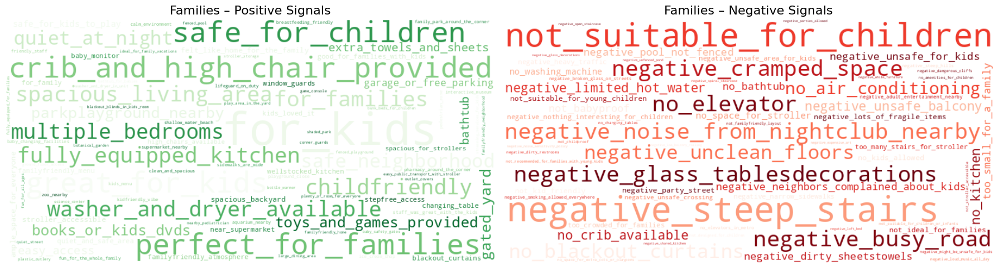

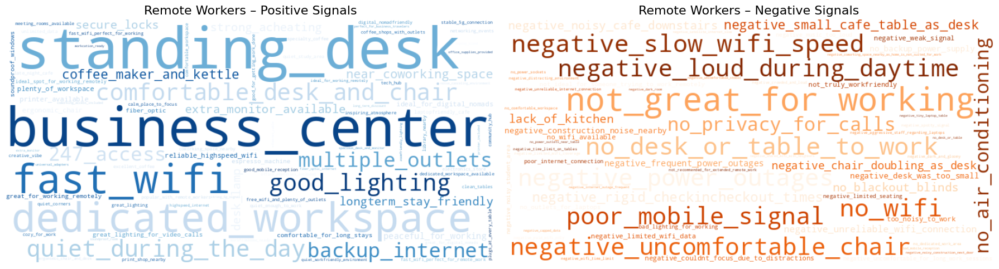

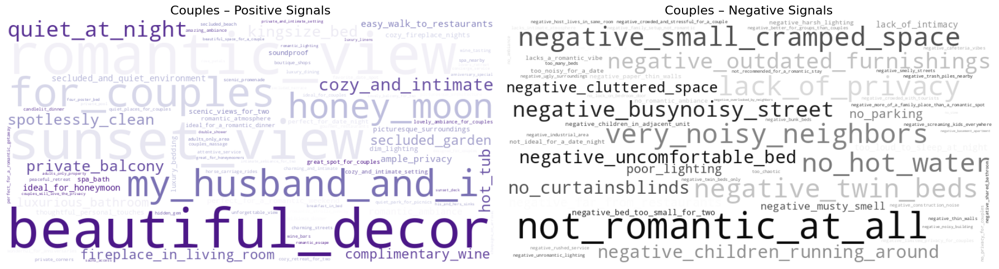

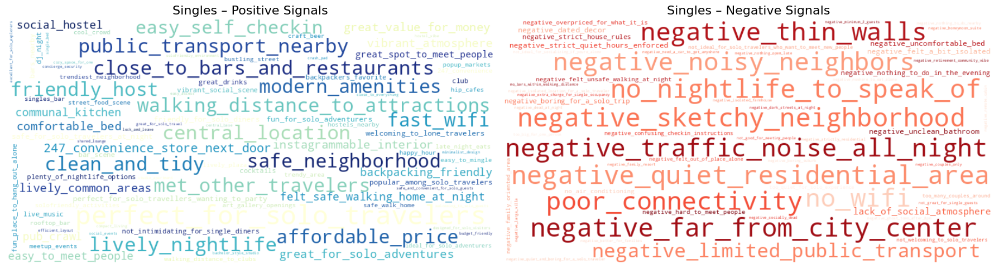

In [0]:
# PERSONA WORDCLOUD — PHRASE-BASED (NO SEMANTIC LEAKAGE)
# Single Cell — works for all personas & all lexicon sources

import re
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Phrase - single semantic token
def phrase_to_token(phrase):
    phrase = phrase.lower().strip()
    phrase = re.sub(r"[^\w\s]", "", phrase)   # remove punctuation
    phrase = re.sub(r"\s+", "_", phrase)      # spaces to _
    return phrase

# Generic negation detection
NEGATION_PREFIXES = [
    "not ", "no ", "lack of ", "lacks ", "without ",
    "too ", "very ", "poor ", "bad "
]

def is_negative_phrase(phrase):
    phrase = phrase.lower()
    return any(phrase.startswith(p) for p in NEGATION_PREFIXES)

# Collect phrases — phrase based 
def collect_phrases_phrase_based(lexicons, persona, polarity):
    tokens = []

    for source_type in lexicons.values():
        if persona not in source_type:
            continue

        phrases = source_type[persona][polarity]

        for p in phrases:
            token = phrase_to_token(p)

            # enforce strict semantic separation
            if polarity == "negative" and not is_negative_phrase(p):
                token = "negative_" + token

            tokens.append(token)

    return " ".join(tokens)

# Visualization config
persona_colors = {
    "families": {"positive": "Greens", "negative": "Reds"},
    "remote_workers": {"positive": "Blues", "negative": "Oranges"},
    "couples": {"positive": "Purples", "negative": "Greys"},
    "singles": {"positive": "YlGnBu", "negative": "Reds"}
}

persona_titles = {
    "families": "Families",
    "remote_workers": "Remote Workers",
    "couples": "Couples",
    "singles": "Singles"
}

# Plot function
def plot_persona_wordclouds(lexicons, persona):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    for i, polarity in enumerate(["positive", "negative"]):
        text = collect_phrases_phrase_based(
            lexicons=lexicons,
            persona=persona,
            polarity=polarity
        )

        wc = WordCloud(
            width=800,
            height=400,
            background_color="white",
            colormap=persona_colors[persona][polarity],
            max_words=100,
            collocations=False   # CRITICAL: phrase-based only
        ).generate(text)

        axes[i].imshow(wc, interpolation="bilinear")
        axes[i].axis("off")
        axes[i].set_title(
            f"{persona_titles[persona]} – {polarity.capitalize()} Signals",
            fontsize=16
        )

    plt.tight_layout()
    plt.show()

for persona in ["families", "remote_workers", "couples", "singles"]:
    plot_persona_wordclouds(user_text_lexicons, persona)

**The Persona-Based Rating Model - Core Methodology:**

In [0]:
from pyspark.sql.functions import concat_ws, col 

# 1. Final text cleanup - concatenating lists into strings for the UDF
# Our UDF expects strings, not arrays
scoring_base_df = internal_df.withColumn("amenities_str", concat_ws(", ", col("amenities_list"))) \
                             .withColumn("highlights_str", concat_ws(", ", col("highlights_list"))) \
                             .withColumn("reviews_str", concat_ws(" || ", col("reviews")))

# 2. Removing duplicate assets (if there is an asset that appears twice by mistake)
unique_listings = scoring_base_df.dropDuplicates(['listing_name', 'lat', 'long'])

**Setup + Vectorization + Optimized Spatial Join:**

In [0]:
# CELL 1 — Data Preparation + Vectorization + Spatial Join:
# 1) Builds config and semantic lexicons (Word2Vec centroids)
# 2) Broadcasts config/model to executors
# 3) Vectorizes places + listings (text -> vectors)
# 4) Performs optimized spatial join (grid bucketing + bbox + haversine)
# 5) Aggregates nearby context into a single centroid vector per listing
# Output: final_prep_df (ready for scoring)

from functools import reduce
from pyspark.sql import DataFrame
from pyspark.sql.functions import (
    col, lit, acos, cos, sin, radians, udf, collect_list, count,
    when, greatest, floor, explode, array, struct, abs as ps_abs
)
from pyspark.sql.types import DoubleType, StringType, MapType, ArrayType
import numpy as np
import math

# Global constants
RADIUS_KM = 1.5
EARTH_KM = 6371.0

# 1) CONFIGURATION & BROADCAST
full_config_data = {
    "text_lexicons": user_text_lexicons,
    "amenities_map": {
        "singles": ["wifi", "self check-in", "lockbox", "gym", "kitchen"],
        "couples": ["hot tub", "jacuzzi", "king size bed", "patio", "balcony", "sound system", "dimmable lighting"],
        "families": ["crib", "high chair", "baby bath", "pack ’n play/travel crib", "changing table",
                     "children’s books and toys", "bathtub", "washing machine"],
        "remote_workers": ["wifi", "dedicated workspace", "ethernet", "office chair", "coffee maker", "keypad"],
    },
    "highlights_map": {
        "singles": {"self check-in": 5.0, "vibrant neighbourhood": 4.0, "superhost": 2.0, "great location": 4.0, "in center": 4.0},
        "couples": {"superhost": 3.0, "great location": 4.0, "self check-in": 2.0, "couples": 5.0, "romantic": 5.0,"dining outside": 3.0},
        "families": {"families": 5.0, "superhost": 4.0, "free parking": 3.0, "kitchen": 3.0, "self check-in": 2.0, "kids": 5.0, "quiet": 4.0},
        "remote_workers": {"fast wifi": 6.0, "workspace": 6.0, "self check-in": 5.0, "superhost": 2.0, "quiet": 4.0},
    }
}

def get_phrase_vector(phrase_list, model):
    all_phrase_vectors = []
    for phrase in phrase_list:
        words = str(phrase).lower().replace(",", "").split()
        word_vecs = [model.get_vector(w) for w in words if w in model.key_to_index]
        if word_vecs:
            all_phrase_vectors.append(np.mean(word_vecs, axis=0))
    if not all_phrase_vectors:
        return None
    return np.mean(all_phrase_vectors, axis=0).tolist()

# Build semantic lexicons (centroids)
semantic_lexicons = {}
for source_key in user_text_lexicons:
    semantic_lexicons[source_key] = {}
    for persona in ["singles", "couples", "families", "remote_workers"]:
        semantic_lexicons[source_key][persona] = {
            "positive": get_phrase_vector(user_text_lexicons[source_key][persona]["positive"], w2v_model),
            "negative": get_phrase_vector(user_text_lexicons[source_key][persona]["negative"], w2v_model),
        }

semantic_lexicons["amenities"] = {}
for persona, a_list in full_config_data["amenities_map"].items():
    semantic_lexicons["amenities"][persona] = get_phrase_vector(a_list, w2v_model)

semantic_lexicons["highlights"] = {}
for persona, h_dict in full_config_data["highlights_map"].items():
    semantic_lexicons["highlights"][persona] = get_phrase_vector(list(h_dict.keys()), w2v_model)

full_config_data["semantic_lexicons"] = semantic_lexicons

# Broadcast config + model
bc_config = spark.sparkContext.broadcast(full_config_data)
bc_w2v_model = spark.sparkContext.broadcast(w2v_model)

# 2) PRECOMPUTE: TEXT to VECTOR UDFS
def text_to_vector_func(text):
    if text is None:
        return None
    s = str(text).strip()
    if not s:
        return None

    model = bc_w2v_model.value
    words = s.lower().replace("||", " ").replace(",", " ").split()
    vecs = [model.get_vector(w) for w in words if w in model.key_to_index]
    if not vecs:
        return None
    return np.mean(vecs, axis=0).tolist()

vector_udf = udf(text_to_vector_func, ArrayType(DoubleType()))

def average_vectors_func(vectors_list):
    if not vectors_list:
        return None
    valid = [v for v in vectors_list if v is not None]
    if not valid:
        return None
    return np.mean(valid, axis=0).tolist()

avg_vec_udf = udf(average_vectors_func, ArrayType(DoubleType()))

# 3) CLEAN PLACES + VECTORIZE
def clean_places_data_and_vectorize(df, city_name):
    current_columns = df.columns

    # latitude
    if "latitude" in current_columns:
        lat_col = "latitude"
    elif "lat" in current_columns:
        lat_col = "lat"
    else:
        raise ValueError(f"Missing latitude column in {city_name}. Found: {current_columns}")

    # longitude
    if "longitude" in current_columns:
        lon_col = "longitude"
    elif "long" in current_columns:
        lon_col = "long"
    else:
        raise ValueError(f"Missing longitude column in {city_name}. Found: {current_columns}")

    category_col = "category" if "category" in current_columns else current_columns[1]

    return (
        df.select(
            col("place_name"),
            col(category_col).alias("place_category"),
            col(lat_col).cast("double").alias("place_lat"),
            col(lon_col).cast("double").alias("place_lon"),
            col("reviews_content").alias("place_review"),
            lit(city_name).alias("source_city"),
        )
        .filter(col("place_lat").isNotNull() & col("place_lon").isNotNull())
        .withColumn("place_vec", vector_udf(col("place_review")))
    )

city_dfs = [(df_obj, city_key.replace("_", " ").title()) for city_key, df_obj in dfs.items()]
cleaned_dfs_list = [clean_places_data_and_vectorize(df, name) for df, name in city_dfs]
places_clean_df = reduce(DataFrame.unionByName, cleaned_dfs_list).cache()

print(f"Places loaded with vectors. Count: {places_clean_df.count()}")
display(places_clean_df.select("source_city").distinct())

# 4) PREPARE LISTINGS + VECTORIZE
listings_ready_df = (
    unique_listings
    .filter(col("lat").isNotNull() & col("long").isNotNull())
    .withColumn("highlights_vec", vector_udf(col("highlights_str")))
    .withColumn("desc_vec", vector_udf(col("description")))
    .withColumn("prop_reviews_vec", vector_udf(col("reviews_str")))
    .withColumn("amenities_vec", vector_udf(col("amenities_str")))
)

# 5) OPTIMIZED SPATIAL JOIN: GRID BUCKETING + NEIGHBORS + BBOX
CELL_SIZE_DEG = float(RADIUS_KM / 111.0)  # ~0.0135 deg for 1.5km

listings_grid = (
    listings_ready_df
    .withColumn("cell_x", floor(col("lat") / lit(CELL_SIZE_DEG)).cast("long"))
    .withColumn("cell_y", floor(col("long") / lit(CELL_SIZE_DEG)).cast("long"))
)

places_grid = (
    places_clean_df
    .withColumn("cell_x", floor(col("place_lat") / lit(CELL_SIZE_DEG)).cast("long"))
    .withColumn("cell_y", floor(col("place_lon") / lit(CELL_SIZE_DEG)).cast("long"))
)

neighbors = array(
    struct((col("cell_x") + lit(-1)).alias("nx"), (col("cell_y") + lit(-1)).alias("ny")),
    struct((col("cell_x") + lit(-1)).alias("nx"), (col("cell_y") + lit( 0)).alias("ny")),
    struct((col("cell_x") + lit(-1)).alias("nx"), (col("cell_y") + lit( 1)).alias("ny")),
    struct((col("cell_x") + lit( 0)).alias("nx"), (col("cell_y") + lit(-1)).alias("ny")),
    struct((col("cell_x") + lit( 0)).alias("nx"), (col("cell_y") + lit( 0)).alias("ny")),
    struct((col("cell_x") + lit( 0)).alias("nx"), (col("cell_y") + lit( 1)).alias("ny")),
    struct((col("cell_x") + lit( 1)).alias("nx"), (col("cell_y") + lit(-1)).alias("ny")),
    struct((col("cell_x") + lit( 1)).alias("nx"), (col("cell_y") + lit( 0)).alias("ny")),
    struct((col("cell_x") + lit( 1)).alias("nx"), (col("cell_y") + lit( 1)).alias("ny")),
)

listings_expanded = (
    listings_grid
    .withColumn("nbr", explode(neighbors))
    .withColumn("join_x", col("nbr.nx"))
    .withColumn("join_y", col("nbr.ny"))
    .drop("nbr")
)

candidates = (
    listings_expanded.join(
        places_grid,
        on=[
            listings_expanded["source_city"] == places_grid["source_city"],
            listings_expanded["join_x"] == places_grid["cell_x"],
            listings_expanded["join_y"] == places_grid["cell_y"],
        ],
        how="inner"
    ).drop(places_grid["source_city"])
)

lat_delta = lit(RADIUS_KM / 111.0)
lon_delta = lit(RADIUS_KM / 111.0) / cos(radians(col("lat")))

candidates_bbox = candidates.filter(
    (ps_abs(col("place_lat") - col("lat")) <= lat_delta) &
    (ps_abs(col("place_lon") - col("long")) <= lon_delta)
)

dist_expr = acos(
    sin(radians(col("lat"))) * sin(radians(col("place_lat"))) +
    cos(radians(col("lat"))) * cos(radians(col("place_lat"))) *
    cos(radians(col("place_lon")) - radians(col("long")))
) * lit(EARTH_KM)

nearby_places = (
    candidates_bbox
    .withColumn("distance", dist_expr)
    .filter(col("distance") <= lit(RADIUS_KM))
)

# 6) Aggeration: collect vectors + centroid for nearby context
nearby_stats = nearby_places.groupBy(
    "source_city", "listing_name", "url", "image", "lat", "long",
    "description", "guests", "ratings",
    "amenities_str", "highlights_str", "reviews_str",
    "highlights_vec", "desc_vec", "prop_reviews_vec", "amenities_vec"
).agg(
    count("place_name").alias("nearby_count"),
    collect_list("place_category").alias("nearby_categories_list"),
    collect_list("place_vec").alias("nearby_vecs_list"),
)

final_prep_df = (
    nearby_stats
    .withColumn("nearby_context_vec", avg_vec_udf(col("nearby_vecs_list")))
    .drop("nearby_vecs_list")
)

Places loaded with vectors. Count: 32475


source_city
Barcelona
Budapest
Buenos Aires
Lisbon
Mexico City
Miami
New York
Paris
Phuket
Tel Aviv


**Persona Scoring Engine and Final Output:**

In [0]:
# Persona Scoring + Final Output Table 
# Design Intent:
# - Singles & Couples should cluster toward "central" areas:
#   higher density (nearby_count), nightlife, dining, culture.
# - Remote Workers should prefer "farther from center":
#   lower density, quieter areas, but with work infrastructure + WiFi.
# - Families should have reduced impact (avoid dominating the dataset).
# - Explainability: debug JSON per persona.
# Decision Rules:
# (A) Scores are computed per persona (model output).
# (B) Dominant persona is chosen fairly using percentile calibration.
# (C) Presentation normalization: the dominant persona score is set to the max
# among the four displayed scores (for consistency in the final table),
# while raw scores are preserved in *_raw columns.

from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType, StringType, MapType, StructType, StructField
from pyspark.sql.window import Window

# Global configuration
PERSONAS = ["singles", "couples", "families", "remote_workers"]

THRESHOLD_HIGHLIGHTS = 0.80
THRESHOLD_AMENITIES  = 0.65

SIGMOID_SLOPE = 0.038

# Bias tuning:
# - Families bias increased to reduces dominance
# - Singles/Couples bias decreased to easier to stand out centrally
BIAS_MAP = {
    "singles": 56.0,
    "couples": 56.0,
    "families": 70.0,
    "remote_workers": 62.0,
}

OVERALL_MODE = "top2"  


# 7) SCORING UDF 
def calculate_scores_from_vectors_with_debug(
    h_vec, d_vec, p_vec, a_vec, n_vec,
    highlights_str, desc_str, amenities_str,
    nearby_cats, guests, nearby_count
):
    import numpy as np
    import math
    import json
    import re

    conf = bc_config.value
    sem_lex = conf["semantic_lexicons"]

    def cosine_sim(vec_a, vec_b):
        if vec_a is None or vec_b is None:
            return 0.0
        try:
            va = np.array(vec_a, dtype=float)
            vb = np.array(vec_b, dtype=float)
            na = np.linalg.norm(va)
            nb = np.linalg.norm(vb)
            if na == 0.0 or nb == 0.0:
                return 0.0
            return float(np.dot(va, vb) / (na * nb))
        except Exception:
            return 0.0

    def safe_int(x, default=0):
        try:
            return int(float(x)) if x is not None and x != "" else default
        except Exception:
            return default

    # Normalize input texts
    highlights_lower = str(highlights_str).lower() if highlights_str else ""
    desc_lower       = str(desc_str).lower()      if desc_str else ""
    amenities_lower  = str(amenities_str).lower() if amenities_str else ""

    # Robust nearby categories counting
    TARGET_CATS = [
        "nightlife",
        "culture",
        "wellness_lifestyle",
        "dining",
        "parks_recreation",
        "work_infrastructure",
    ]

    def parse_nearby_tokens(x):
        if isinstance(x, (list, tuple)):
            return [str(t).lower() for t in x if t is not None]
        s = str(x).lower() if x is not None else ""
        return re.findall(r"[a-z_]+", s)

    nearby_tokens = parse_nearby_tokens(nearby_cats)
    token_counts = {c: 0 for c in TARGET_CATS}
    for t in nearby_tokens:
        if t in token_counts:
            token_counts[t] += 1

    nightlife_count = token_counts["nightlife"]
    culture_hits    = token_counts["culture"]
    wellness_hits   = token_counts["wellness_lifestyle"]
    dining_hits     = token_counts["dining"]
    parks_count     = token_counts["parks_recreation"]
    work_hits       = token_counts["work_infrastructure"]

    # Flags
    is_quiet = ("quiet" in desc_lower) or ("residential" in desc_lower) or ("peaceful" in desc_lower)
    has_baby_gear = ("crib" in amenities_lower) or ("high chair" in amenities_lower) or ("baby" in amenities_lower)
    has_romantic_gear = ("jacuzzi" in amenities_lower) or ("hot tub" in amenities_lower) or ("sauna" in amenities_lower)
    has_wifi = ("wifi" in amenities_lower)

    guests_int       = safe_int(guests, 0)
    nearby_count_int = safe_int(nearby_count, 0)

    # Density proxy (centrality)
    density_base = math.log1p(max(nearby_count_int, 0))

    scores = {}
    debug_strings = {}

    for persona in PERSONAS:
        raw_score = 0.0

        # (1) Semantic scoring (POS - NEG)
        sem_desc_pos = cosine_sim(d_vec, sem_lex["listing_description"][persona]["positive"]) * 14.0
        sem_prop_pos = cosine_sim(p_vec, sem_lex["property_reviews"][persona]["positive"])    * 18.0
        sem_near_pos = cosine_sim(n_vec, sem_lex["nearby_places_reviews"][persona]["positive"]) * 12.0
        sem_pos = sem_desc_pos + sem_prop_pos + sem_near_pos

        sem_prop_neg = cosine_sim(p_vec, sem_lex["property_reviews"][persona]["negative"])   * 22.0
        sem_desc_neg = cosine_sim(d_vec, sem_lex["listing_description"][persona]["negative"])* 12.0
        sem_near_neg = cosine_sim(n_vec, sem_lex["nearby_places_reviews"][persona]["negative"]) * 16.0
        sem_neg = sem_prop_neg + sem_desc_neg + sem_near_neg

        raw_score += sem_pos
        raw_score -= sem_neg

        # (2) Vector boosts (threshold-gated)
        sim_h = cosine_sim(h_vec, sem_lex["highlights"][persona])
        highlight_vec_boost = (sim_h * 12.0) if (sim_h > THRESHOLD_HIGHLIGHTS) else 0.0
        raw_score += highlight_vec_boost

        sim_a = cosine_sim(a_vec, sem_lex["amenities"][persona])
        amenities_vec_boost = (sim_a * 12.0) if (sim_a > THRESHOLD_AMENITIES) else 0.0
        raw_score += amenities_vec_boost

        # (3) Keyword boosts (highlights substring match)
        kw_boost = 0.0
        hits_list = []
        persona_h_map = conf["highlights_map"].get(persona, {})
        for h_text, bonus in persona_h_map.items():
            if h_text and (h_text.lower() in highlights_lower):
                mult = 3.0 if persona == "remote_workers" else 1.4
                added = float(bonus) * mult
                kw_boost += added
                hits_list.append(f"{h_text}:{round(added, 2)}")

        raw_score += kw_boost

        # (4) Rule-based logic (Center vs. Farther-from-center)
        logic_score = 0.0

        if persona in ["singles", "couples"]:
            logic_score += density_base * 3.2
        elif persona == "remote_workers":
            logic_score -= density_base * 2.8
        else:
            logic_score += density_base * 0.6

        if persona == "singles":
            logic_score += min(nightlife_count, 20) * 1.7
            logic_score += min(dining_hits, 20) * 1.1
            logic_score += min(culture_hits, 14) * 1.0
            if is_quiet:
                logic_score -= 10.0
            if guests_int >= 4:
                logic_score -= 6.0

        elif persona == "couples":
            if has_romantic_gear:
                logic_score += 16.0
            logic_score += min(dining_hits, 18) * 1.2
            logic_score += min(wellness_hits, 14) * 1.8
            logic_score += min(culture_hits, 14) * 1.5
            if nightlife_count > 16:
                logic_score -= 6.0
            if is_quiet:
                logic_score += 4.0

        elif persona == "families":
            if guests_int < 3:
                logic_score -= 10.0
            elif guests_int == 3:
                logic_score += 4.0
            elif guests_int >= 4:
                logic_score += 10.0

            if has_baby_gear:
                logic_score += 10.0

            logic_score += min(parks_count, 18) * 2.6
            logic_score -= min(nightlife_count, 25) * 1.2

            if is_quiet:
                logic_score += 6.0

        elif persona == "remote_workers":
            if not has_wifi:
                logic_score -= 28.0
            else:
                if "workspace" in desc_lower or "desk" in desc_lower: #stonger wheight
                    logic_score += 10.0
                if "fast" in desc_lower:
                    logic_score += 6.0

            logic_score += min(work_hits, 14) * 4.6

            if is_quiet:
                logic_score += 10.0
            if nightlife_count > 10:
                logic_score -= 8.0
            if guests_int >= 5:
                logic_score -= 6.0

        raw_score += logic_score

        # (5) Normaliziation
        bias = float(BIAS_MAP.get(persona, 58.0))
        norm_score = 100.0 / (1.0 + math.exp(-SIGMOID_SLOPE * (raw_score - bias)))
        norm_score = float(round(norm_score, 1))
        scores[persona] = norm_score

        # Debug 
        dbg = {
            "sem_pos_total": round(sem_pos, 2),
            "sem_neg_total": round(-sem_neg, 2),
            "highlight_vec_sim": round(sim_h, 3),
            "highlight_vec_boost": round(highlight_vec_boost, 2),
            "amenities_vec_sim": round(sim_a, 3),
            "amenities_vec_boost": round(amenities_vec_boost, 2),
            "keyword_boost_total": round(kw_boost, 2),
            "keyword_hits": hits_list[:20],
            "logic_score": round(logic_score, 2),
            "density_base_log1p": round(density_base, 3),
            "nearby_counts": {
                "nightlife": int(nightlife_count),
                "culture": int(culture_hits),
                "wellness": int(wellness_hits),
                "dining": int(dining_hits),
                "parks": int(parks_count),
                "work_infra": int(work_hits),
                "nearby_count": int(nearby_count_int),
            },
            "flags": {
                "is_quiet": bool(is_quiet),
                "has_wifi": bool(has_wifi),
                "has_baby_gear": bool(has_baby_gear),
                "has_romantic_gear": bool(has_romantic_gear),
            },
            "raw_score": round(raw_score, 2),
            "bias": float(bias),
            "sigmoid_slope": float(SIGMOID_SLOPE),
            "norm_score": float(norm_score),
        }

        debug_strings[persona] = json.dumps(dbg, ensure_ascii=False)

    return (scores, debug_strings)


# UDF schema: (scores_map, debug_map)
score_debug_schema = StructType([
    StructField("scores", MapType(StringType(), DoubleType()), True),
    StructField("debug",  MapType(StringType(), StringType()), True),
])

score_vectors_debug_udf = F.udf(calculate_scores_from_vectors_with_debug, score_debug_schema)


# 8) Execute + Final table 
final_prep_df = final_prep_df.repartition(spark.sparkContext.defaultParallelism)

result_df = (
    final_prep_df
    .withColumn(
        "scoring",
        score_vectors_debug_udf(
            F.col("highlights_vec"),
            F.col("desc_vec"),
            F.col("prop_reviews_vec"),
            F.col("amenities_vec"),
            F.col("nearby_context_vec"),
            F.col("highlights_str"),
            F.col("description"),
            F.col("amenities_str"),
            F.col("nearby_categories_list"),
            F.col("guests"),
            F.col("nearby_count"),
        )
    )
    .withColumn("scores", F.col("scoring.scores"))
    .withColumn("debug",  F.col("scoring.debug"))
)

final_display = (
    result_df.select(
        F.col("source_city"),
        F.col("listing_name"),
        F.col("image"),
        F.col("url"),
        F.col("guests"),
        F.col("nearby_count"),
        F.col("ratings").alias("rating"),

        F.coalesce(F.col("scores.singles"),        F.lit(0.0)).alias("score_singles"),
        F.coalesce(F.col("scores.couples"),        F.lit(0.0)).alias("score_couples"),
        F.coalesce(F.col("scores.families"),       F.lit(0.0)).alias("score_families"),
        F.coalesce(F.col("scores.remote_workers"), F.lit(0.0)).alias("score_work"),

        F.col("highlights_str"),

        F.col("debug.singles").alias("debug_singles"),
        F.col("debug.couples").alias("debug_couples"),
        F.col("debug.families").alias("debug_families"),
        F.col("debug.remote_workers").alias("debug_work"),

        F.col("lat"),
        F.col("long"),
    )
)

# 9) Dominant persona (Percentile-based decision rule)
w_s  = Window.orderBy(F.col("score_singles"))
w_c  = Window.orderBy(F.col("score_couples"))
w_f  = Window.orderBy(F.col("score_families"))
w_rw = Window.orderBy(F.col("score_work"))

final_display = (
    final_display
    .withColumn("pct_singles",  F.percent_rank().over(w_s))
    .withColumn("pct_couples",  F.percent_rank().over(w_c))
    .withColumn("pct_families", F.percent_rank().over(w_f))
    .withColumn("pct_work",     F.percent_rank().over(w_rw))
    .withColumn(
        "persona_rank",
        F.array(
            F.struct(F.col("pct_singles").alias("score"),  F.lit("Singles").alias("persona")),
            F.struct(F.col("pct_couples").alias("score"),  F.lit("Couples").alias("persona")),
            F.struct(F.col("pct_families").alias("score"), F.lit("Families").alias("persona")),
            F.struct(F.col("pct_work").alias("score"),     F.lit("Remote Workers").alias("persona")),
        )
    )
    .withColumn("best_persona_struct", F.array_max(F.col("persona_rank")))
    .withColumn("dominant_persona", F.col("best_persona_struct.persona"))
    .drop("persona_rank", "best_persona_struct")
)

# 9.1) Preserve RAW scores (for evaluation/debug), then normalize display:
# Ensure the dominant persona score is the highest among the four (presentation).
from pyspark.sql import functions as F

final_display = (
    final_display

    # Preserve original (pre-presentation) scores
    .withColumn("score_singles_raw",  F.col("score_singles"))
    .withColumn("score_couples_raw",  F.col("score_couples"))
    .withColumn("score_families_raw", F.col("score_families"))
    .withColumn("score_work_raw",     F.col("score_work"))

    # Compute max score across personas (normalized scores)
    .withColumn(
        "max_score",
        F.greatest(
            F.col("score_singles"),
            F.col("score_couples"),
            F.col("score_families"),
            F.col("score_work")
        )
    )

    # For presentation only:
    # Force the dominant persona to display the max score
    # Dominant persona already incorporates percentile + raw tie-break
    .withColumn(
        "score_singles",
        F.when(F.col("dominant_persona") == F.lit("Singles"), F.col("max_score"))
         .otherwise(F.col("score_singles"))
    )
    .withColumn(
        "score_couples",
        F.when(F.col("dominant_persona") == F.lit("Couples"), F.col("max_score"))
         .otherwise(F.col("score_couples"))
    )
    .withColumn(
        "score_families",
        F.when(F.col("dominant_persona") == F.lit("Families"), F.col("max_score"))
         .otherwise(F.col("score_families"))
    )
    .withColumn(
        "score_work",
        F.when(F.col("dominant_persona") == F.lit("Remote Workers"), F.col("max_score"))
         .otherwise(F.col("score_work"))
    )

    .drop("max_score")
)


# 10) Overall score
# Important: Use RAW scores for overall_score to avoid inflating ranking due to display normalization.
if OVERALL_MODE == "top2":
    final_display = (
        final_display
        .withColumn(
            "sorted_scores_desc_raw",
            F.expr(
                "array_sort(array(score_singles_raw, score_couples_raw, score_families_raw, score_work_raw), "
                "(l, r) -> case when l > r then -1 when l < r then 1 else 0 end)"
            )
        )
        .withColumn(
            "overall_score",
            (F.col("sorted_scores_desc_raw")[0] + F.col("sorted_scores_desc_raw")[1]) / F.lit(2.0)
        )
        .drop("sorted_scores_desc_raw")
    )
else:
    final_display = final_display.withColumn(
        "overall_score",
        (F.col("score_singles_raw") + F.col("score_couples_raw") + F.col("score_families_raw") + F.col("score_work_raw")) / F.lit(4.0)
    )

final_display.cache()
print(f"Deep Analysis (With Debug) Complete. Final Count: {final_display.count()}")

display(final_display.orderBy(F.col('overall_score').desc()).limit(100))

# Distribution check
final_display.groupBy("dominant_persona").count().display()

# Separation check (RAW separation is more honest for evaluation)
final_display.selectExpr(
  "greatest(score_singles_raw,score_couples_raw,score_families_raw,score_work_raw) - "
  "least(score_singles_raw,score_couples_raw,score_families_raw,score_work_raw) as persona_gap_raw"
).summary().display()

# Cleanup 
try:
    places_clean_df.unpersist()
except Exception:
    pass

try:
    result_df.unpersist()
except Exception:
    pass

Deep Analysis (With Debug) Complete. Final Count: 14363


source_city,listing_name,image,url,guests,nearby_count,rating,score_singles,score_couples,score_families,score_work,highlights_str,debug_singles,debug_couples,debug_families,debug_work,lat,long,pct_singles,pct_couples,pct_families,pct_work,dominant_persona,score_singles_raw,score_couples_raw,score_families_raw,score_work_raw,overall_score
Budapest,"Entire apartment in Budapest, Hungary",https://a0.muscache.com/pictures/e7f02b21-eac4-4555-bcc3-db181a97c426.jpg,https://www.airbnb.com/rooms/53903632,2,1157,4.87,91.5,87.8,14.3,38.7,"Self check-in, Vibrant neighbourhood, Timea is a Superhost","{""sem_pos_total"": 39.44, ""sem_neg_total"": -47.13, ""highlight_vec_sim"": 0.881, ""highlight_vec_boost"": 10.57, ""amenities_vec_sim"": 0.654, ""amenities_vec_boost"": 7.84, ""keyword_boost_total"": 15.4, ""keyword_hits"": [""self check-in:7.0"", ""vibrant neighbourhood:5.6"", ""superhost:2.8""], ""logic_score"": 92.57, ""density_base_log1p"": 7.054, ""nearby_counts"": {""nightlife"": 306, ""culture"": 173, ""wellness"": 168, ""dining"": 275, ""parks"": 128, ""work_infra"": 106, ""nearby_count"": 1157}, ""flags"": {""is_quiet"": false, ""has_wifi"": true, ""has_baby_gear"": false, ""has_romantic_gear"": true}, ""raw_score"": 118.69, ""bias"": 56.0, ""sigmoid_slope"": 0.038, ""norm_score"": 91.5}","{""sem_pos_total"": 36.65, ""sem_neg_total"": -45.78, ""highlight_vec_sim"": 0.708, ""highlight_vec_boost"": 0.0, ""amenities_vec_sim"": 0.816, ""amenities_vec_boost"": 9.79, ""keyword_boost_total"": 7.0, ""keyword_hits"": [""superhost:4.2"", ""self check-in:2.8""], ""logic_score"": 100.37, ""density_base_log1p"": 7.054, ""nearby_counts"": {""nightlife"": 306, ""culture"": 173, ""wellness"": 168, ""dining"": 275, ""parks"": 128, ""work_infra"": 106, ""nearby_count"": 1157}, ""flags"": {""is_quiet"": false, ""has_wifi"": true, ""has_baby_gear"": false, ""has_romantic_gear"": true}, ""raw_score"": 108.04, ""bias"": 56.0, ""sigmoid_slope"": 0.038, ""norm_score"": 87.8}","{""sem_pos_total"": 39.23, ""sem_neg_total"": -45.86, ""highlight_vec_sim"": 0.707, ""highlight_vec_boost"": 0.0, ""amenities_vec_sim"": 0.836, ""amenities_vec_boost"": 10.03, ""keyword_boost_total"": 8.4, ""keyword_hits"": [""superhost:5.6"", ""self check-in:2.8""], ""logic_score"": 11.03, ""density_base_log1p"": 7.054, ""nearby_counts"": {""nightlife"": 306, ""culture"": 173, ""wellness"": 168, ""dining"": 275, ""parks"": 128, ""work_infra"": 106, ""nearby_count"": 1157}, ""flags"": {""is_quiet"": false, ""has_wifi"": true, ""has_baby_gear"": false, ""has_romantic_gear"": true}, ""raw_score"": 22.84, ""bias"": 70.0, ""sigmoid_slope"": 0.038, ""norm_score"": 14.3}","{""sem_pos_total"": 38.29, ""sem_neg_total"": -46.0, ""highlight_vec_sim"": 0.701, ""highlight_vec_boost"": 0.0, ""amenities_vec_sim"": 0.618, ""amenities_vec_boost"": 0.0, ""keyword_boost_total"": 21.0, ""keyword_hits"": [""self check-in:15.0"", ""superhost:6.0""], ""logic_score"": 36.65, ""density_base_log1p"": 7.054, ""nearby_counts"": {""nightlife"": 306, ""culture"": 173, ""wellness"": 168, ""dining"": 275, ""parks"": 128, ""work_infra"": 106, ""nearby_count"": 1157}, ""flags"": {""is_quiet"": false, ""has_wifi"": true, ""has_baby_gear"": false, ""has_romantic_gear"": true}, ""raw_score"": 49.94, ""bias"": 62.0, ""sigmoid_slope"": 0.038, ""norm_score"": 38.7}",47.49559,19.0546,0.9997911154435315,0.9979111544353154,0.27475281994151235,0.7265004873972984,Singles,91.5,87.8,14.3,38.7,89.65
Paris,"Room in boutique hotel in Paris, France",https://a0.muscache.com/pictures/miso/Hosting-38900228/original/c1026e1b-1675-4362-980e-c699f39b5e05.jpeg,https://www.airbnb.com/rooms/38900228?adults=2&children=0&infants=0&pets=0,2,822,4.77,89.1,89.1,12.9,32.1,"Exceptional check-in experience, Great location, ⁨Hôtel 34B***⁩ is a Superhost","{""sem_pos_total"": 40.29, ""sem_neg_total"": -47.6, ""highlight_vec_sim"": 0.869, ""highlight_vec_boost"": 10.43, ""amenities_vec_sim"": 0.684, ""amenities_vec_boost"": 8.21, ""keyword_boost_total

dominant_persona,count
Couples,2536
Singles,3657
Families,4834
Remote Workers,3336


summary,persona_gap_raw
count,14363
mean,48.78307456659467
stddev,19.33648278757763
min,1.6000000000000014
25%,38.8
50%,54.0
75%,63.300000000000004
max,83.1


**Internal-Only personas model rating:**

In [0]:
# Cell X - Internal Persona Score Only + Final Output Table 
# Final Version (Internal Data Only) - Same Output Columns

from pyspark.sql import functions as F
from pyspark.sql.types import DoubleType, StringType, MapType, StructType, StructField, ArrayType
from pyspark.sql.window import Window

# Global configuration
PERSONAS = ["singles", "couples", "families", "remote_workers"]

THRESHOLD_HIGHLIGHTS = 0.80
THRESHOLD_AMENITIES  = 0.65

SIGMOID_SLOPE = 0.038

BIAS_MAP = {
    "singles": 56.0,
    "couples": 56.0,
    "families": 70.0,
    "remote_workers": 62.0,
}

OVERALL_MODE = "top2"  # "top2" or "mean4"

# 0) Build internal-only input DF (keep same required columns)
# Assumption: final_prep_df already exists with Internal vectors & fields.
# We create placeholders for external data columns but keep names identical.

final_prep_df_internal = (
    final_prep_df
    .select(
        # keep original identifiers/metadata
        F.col("source_city"),
        F.col("listing_name"),
        F.col("image"),
        F.col("url"),
        F.col("guests"),
        F.col("ratings"),
        F.col("lat"),
        F.col("long"),

        # Internal Text fields
        F.col("highlights_str"),
        F.col("description"),
        F.col("amenities_str"),

        # Internal vectors (NLP outputs)
        F.col("highlights_vec"),
        F.col("desc_vec"),
        F.col("prop_reviews_vec"),
        F.col("amenities_vec"),

        # Extnral placeholders (to keep identical schema)
        F.lit(0).cast("int").alias("nearby_count"),
        F.array().cast(ArrayType(StringType())).alias("nearby_categories_list"),

        # For scoring: we still need nearby_context_vec argument in the UDF.
        # We set it to Internal context vector:
        # prefer prop_reviews_vec; fallback to desc_vec if prop is null.
        F.coalesce(F.col("prop_reviews_vec"), F.col("desc_vec")).alias("nearby_context_vec"),
    )
)

final_prep_df_internal = final_prep_df_internal.repartition(spark.sparkContext.defaultParallelism)

# 1) Scoring UDF (same logic, with explainable debug)
def calculate_scores_from_vectors_with_debug(
    h_vec, d_vec, p_vec, a_vec, n_vec,
    highlights_str, desc_str, amenities_str,
    nearby_cats, guests, nearby_count
):
    import numpy as np
    import math
    import json
    import re

    conf = bc_config.value
    sem_lex = conf["semantic_lexicons"]

    def cosine_sim(vec_a, vec_b):
        if vec_a is None or vec_b is None:
            return 0.0
        try:
            va = np.array(vec_a, dtype=float)
            vb = np.array(vec_b, dtype=float)
            na = np.linalg.norm(va)
            nb = np.linalg.norm(vb)
            if na == 0.0 or nb == 0.0:
                return 0.0
            return float(np.dot(va, vb) / (na * nb))
        except Exception:
            return 0.0

    def safe_int(x, default=0):
        try:
            return int(float(x)) if x is not None and x != "" else default
        except Exception:
            return default

    # Normalize input texts
    highlights_lower = str(highlights_str).lower() if highlights_str else ""
    desc_lower       = str(desc_str).lower()      if desc_str else ""
    amenities_lower  = str(amenities_str).lower() if amenities_str else ""

    # Robust nearby categories counting (in internal-only mode it will be empty / 0)
    TARGET_CATS = [
        "nightlife",
        "culture",
        "wellness_lifestyle",
        "dining",
        "parks_recreation",
        "work_infrastructure",
    ]

    def parse_nearby_tokens(x):
        if isinstance(x, (list, tuple)):
            return [str(t).lower() for t in x if t is not None]
        s = str(x).lower() if x is not None else ""
        return re.findall(r"[a-z_]+", s)

    nearby_tokens = parse_nearby_tokens(nearby_cats)
    token_counts = {c: 0 for c in TARGET_CATS}
    for t in nearby_tokens:
        if t in token_counts:
            token_counts[t] += 1

    nightlife_count = token_counts["nightlife"]
    culture_hits    = token_counts["culture"]
    wellness_hits   = token_counts["wellness_lifestyle"]
    dining_hits     = token_counts["dining"]
    parks_count     = token_counts["parks_recreation"]
    work_hits       = token_counts["work_infrastructure"]

    # Flags
    is_quiet = ("quiet" in desc_lower) or ("residential" in desc_lower) or ("peaceful" in desc_lower)
    has_baby_gear = ("crib" in amenities_lower) or ("high chair" in amenities_lower) or ("baby" in amenities_lower)
    has_romantic_gear = ("jacuzzi" in amenities_lower) or ("hot tub" in amenities_lower) or ("sauna" in amenities_lower)
    has_wifi = ("wifi" in amenities_lower)

    guests_int       = safe_int(guests, 0)
    nearby_count_int = safe_int(nearby_count, 0)

    # Density proxy (centrality) — internal-only to nearby_count=0 by default
    density_base = math.log1p(max(nearby_count_int, 0))

    scores = {}
    debug_strings = {}

    for persona in PERSONAS:
        raw_score = 0.0

        # (1) Semantic scoring (POS - NEG)
        sem_desc_pos = cosine_sim(d_vec, sem_lex["listing_description"][persona]["positive"]) * 14.0
        sem_prop_pos = cosine_sim(p_vec, sem_lex["property_reviews"][persona]["positive"])    * 18.0
        # n_vec is fed by Internal context vector in internal-only mode
        sem_near_pos = cosine_sim(n_vec, sem_lex["nearby_places_reviews"][persona]["positive"]) * 12.0
        sem_pos = sem_desc_pos + sem_prop_pos + sem_near_pos

        sem_prop_neg = cosine_sim(p_vec, sem_lex["property_reviews"][persona]["negative"])   * 22.0
        sem_desc_neg = cosine_sim(d_vec, sem_lex["listing_description"][persona]["negative"])* 12.0
        sem_near_neg = cosine_sim(n_vec, sem_lex["nearby_places_reviews"][persona]["negative"]) * 16.0
        sem_neg = sem_prop_neg + sem_desc_neg + sem_near_neg

        raw_score += sem_pos
        raw_score -= sem_neg

        # (2) Vector boosts (threshold-gated)
        sim_h = cosine_sim(h_vec, sem_lex["highlights"][persona])
        highlight_vec_boost = (sim_h * 12.0) if (sim_h > THRESHOLD_HIGHLIGHTS) else 0.0
        raw_score += highlight_vec_boost

        sim_a = cosine_sim(a_vec, sem_lex["amenities"][persona])
        amenities_vec_boost = (sim_a * 12.0) if (sim_a > THRESHOLD_AMENITIES) else 0.0
        raw_score += amenities_vec_boost

        # (3) Keyword boosts (highlights substring match)
        kw_boost = 0.0
        hits_list = []
        persona_h_map = conf["highlights_map"].get(persona, {})
        for h_text, bonus in persona_h_map.items():
            if h_text and (h_text.lower() in highlights_lower):
                mult = 3.0 if persona == "remote_workers" else 1.4
                added = float(bonus) * mult
                kw_boost += added
                hits_list.append(f"{h_text}:{round(added, 2)}")

        raw_score += kw_boost

        # (4) Rule-based logic (Center vs. Farther-from-center)
        logic_score = 0.0

        if persona in ["singles", "couples"]:
            logic_score += density_base * 3.2
        elif persona == "remote_workers":
            logic_score -= density_base * 2.8
        else:
            logic_score += density_base * 0.6

        if persona == "singles":
            logic_score += min(nightlife_count, 20) * 1.7
            logic_score += min(dining_hits, 20) * 1.1
            logic_score += min(culture_hits, 14) * 1.0
            if is_quiet:
                logic_score -= 10.0
            if guests_int >= 4:
                logic_score -= 6.0

        elif persona == "couples":
            if has_romantic_gear:
                logic_score += 16.0
            logic_score += min(dining_hits, 18) * 1.2
            logic_score += min(wellness_hits, 14) * 1.8
            logic_score += min(culture_hits, 14) * 1.5
            if nightlife_count > 16:
                logic_score -= 6.0
            if is_quiet:
                logic_score += 4.0

        elif persona == "families":
            if guests_int < 3:
                logic_score -= 10.0
            elif guests_int == 3:
                logic_score += 4.0
            elif guests_int >= 4:
                logic_score += 10.0

            if has_baby_gear:
                logic_score += 10.0

            logic_score += min(parks_count, 18) * 2.6
            logic_score -= min(nightlife_count, 25) * 1.2

            if is_quiet:
                logic_score += 6.0

        elif persona == "remote_workers":
            if not has_wifi:
                logic_score -= 28.0
            else:
                if "workspace" in desc_lower or "desk" in desc_lower:
                    logic_score += 10.0
                if "fast" in desc_lower:
                    logic_score += 6.0

            logic_score += min(work_hits, 14) * 4.6

            if is_quiet:
                logic_score += 10.0
            if nightlife_count > 10:
                logic_score -= 8.0
            if guests_int >= 5:
                logic_score -= 6.0

        raw_score += logic_score

        # (5) Normalization 
        bias = float(BIAS_MAP.get(persona, 58.0))
        norm_score = 100.0 / (1.0 + math.exp(-SIGMOID_SLOPE * (raw_score - bias)))
        norm_score = float(round(norm_score, 1))
        scores[persona] = norm_score

        # Debug JSON
        dbg = {
            "sem_pos_total": round(sem_pos, 2),
            "sem_neg_total": round(-sem_neg, 2),
            "highlight_vec_sim": round(sim_h, 3),
            "highlight_vec_boost": round(highlight_vec_boost, 2),
            "amenities_vec_sim": round(sim_a, 3),
            "amenities_vec_boost": round(amenities_vec_boost, 2),
            "keyword_boost_total": round(kw_boost, 2),
            "keyword_hits": hits_list[:20],
            "logic_score": round(logic_score, 2),
            "density_base_log1p": round(density_base, 3),
            "nearby_counts": {
                "nightlife": int(nightlife_count),
                "culture": int(culture_hits),
                "wellness": int(wellness_hits),
                "dining": int(dining_hits),
                "parks": int(parks_count),
                "work_infra": int(work_hits),
                "nearby_count": int(nearby_count_int),
            },
            "flags": {
                "is_quiet": bool(is_quiet),
                "has_wifi": bool(has_wifi),
                "has_baby_gear": bool(has_baby_gear),
                "has_romantic_gear": bool(has_romantic_gear),
            },
            "raw_score": round(raw_score, 2),
            "bias": float(bias),
            "sigmoid_slope": float(SIGMOID_SLOPE),
            "norm_score": float(norm_score),
        }

        debug_strings[persona] = json.dumps(dbg, ensure_ascii=False)

    return (scores, debug_strings)


score_debug_schema = StructType([
    StructField("scores", MapType(StringType(), DoubleType()), True),
    StructField("debug",  MapType(StringType(), StringType()), True),
])

score_vectors_debug_udf = F.udf(calculate_scores_from_vectors_with_debug, score_debug_schema)

# 2) Execute + Final table (same columns)
result_df_internal = (
    final_prep_df_internal
    .withColumn(
        "scoring",
        score_vectors_debug_udf(
            F.col("highlights_vec"),
            F.col("desc_vec"),
            F.col("prop_reviews_vec"),
            F.col("amenities_vec"),
            F.col("nearby_context_vec"),
            F.col("highlights_str"),
            F.col("description"),
            F.col("amenities_str"),
            F.col("nearby_categories_list"),
            F.col("guests"),
            F.col("nearby_count"),
        )
    )
    .withColumn("scores", F.col("scoring.scores"))
    .withColumn("debug",  F.col("scoring.debug"))
)

final_display_internal = (
    result_df_internal.select(
        F.col("source_city"),
        F.col("listing_name"),
        F.col("image"),
        F.col("url"),
        F.col("guests"),
        F.col("nearby_count"),
        F.col("ratings").alias("rating"),

        F.coalesce(F.col("scores.singles"),        F.lit(0.0)).alias("score_singles"),
        F.coalesce(F.col("scores.couples"),        F.lit(0.0)).alias("score_couples"),
        F.coalesce(F.col("scores.families"),       F.lit(0.0)).alias("score_families"),
        F.coalesce(F.col("scores.remote_workers"), F.lit(0.0)).alias("score_work"),

        F.col("highlights_str"),

        F.col("debug.singles").alias("debug_singles"),
        F.col("debug.couples").alias("debug_couples"),
        F.col("debug.families").alias("debug_families"),
        F.col("debug.remote_workers").alias("debug_work"),

        F.col("lat"),
        F.col("long"),
    )
)

# 3) Fair Dominant Persona (Percentile-based decision rule)
w_s  = Window.orderBy(F.col("score_singles"))
w_c  = Window.orderBy(F.col("score_couples"))
w_f  = Window.orderBy(F.col("score_families"))
w_rw = Window.orderBy(F.col("score_work"))

final_display_internal = (
    final_display_internal
    .withColumn("pct_singles",  F.percent_rank().over(w_s))
    .withColumn("pct_couples",  F.percent_rank().over(w_c))
    .withColumn("pct_families", F.percent_rank().over(w_f))
    .withColumn("pct_work",     F.percent_rank().over(w_rw))
    .withColumn(
        "persona_rank",
        F.array(
            F.struct(F.col("pct_singles").alias("score"),  F.lit("Singles").alias("persona")),
            F.struct(F.col("pct_couples").alias("score"),  F.lit("Couples").alias("persona")),
            F.struct(F.col("pct_families").alias("score"), F.lit("Families").alias("persona")),
            F.struct(F.col("pct_work").alias("score"),     F.lit("Remote Workers").alias("persona")),
        )
    )
    .withColumn("best_persona_struct", F.array_max(F.col("persona_rank")))
    .withColumn("dominant_persona", F.col("best_persona_struct.persona"))
    .drop("persona_rank", "best_persona_struct")
)

# 4) Preserve RAW scores + presentation normalization (same as original)
final_display_internal = (
    final_display_internal
    .withColumn("score_singles_raw",  F.col("score_singles"))
    .withColumn("score_couples_raw",  F.col("score_couples"))
    .withColumn("score_families_raw", F.col("score_families"))
    .withColumn("score_work_raw",     F.col("score_work"))
    .withColumn(
        "max_score",
        F.greatest(
            F.col("score_singles"),
            F.col("score_couples"),
            F.col("score_families"),
            F.col("score_work"),
        )
    )
    .withColumn(
        "score_singles",
        F.when(F.col("dominant_persona") == F.lit("Singles"), F.col("max_score")).otherwise(F.col("score_singles"))
    )
    .withColumn(
        "score_couples",
        F.when(F.col("dominant_persona") == F.lit("Couples"), F.col("max_score")).otherwise(F.col("score_couples"))
    )
    .withColumn(
        "score_families",
        F.when(F.col("dominant_persona") == F.lit("Families"), F.col("max_score")).otherwise(F.col("score_families"))
    )
    .withColumn(
        "score_work",
        F.when(F.col("dominant_persona") == F.lit("Remote Workers"), F.col("max_score")).otherwise(F.col("score_work"))
    )
    .drop("max_score")
)

# 5) Overall score (RAW only)
if OVERALL_MODE == "top2":
    final_display_internal = (
        final_display_internal
        .withColumn(
            "sorted_scores_desc_raw",
            F.expr(
                "array_sort(array(score_singles_raw, score_couples_raw, score_families_raw, score_work_raw), "
                "(l, r) -> case when l > r then -1 when l < r then 1 else 0 end)"
            )
        )
        .withColumn(
            "overall_score",
            (F.col("sorted_scores_desc_raw")[0] + F.col("sorted_scores_desc_raw")[1]) / F.lit(2.0)
        )
        .drop("sorted_scores_desc_raw")
    )
else:
    final_display_internal = final_display_internal.withColumn(
        "overall_score",
        (F.col("score_singles_raw") + F.col("score_couples_raw") + F.col("score_families_raw") + F.col("score_work_raw")) / F.lit(4.0)
    )

final_display_internal.cache()
print(f"INTERNAL-ONLY Deep Analysis (With Debug) Complete. Final Count: {final_display_internal.count()}")

display(final_display_internal.orderBy(F.col("overall_score").desc()).limit(100))

# Distribution check
final_display_internal.groupBy("dominant_persona").count().display()

# Separation check (RAW separation is more honest for evaluation)
final_display_internal.selectExpr(
  "greatest(score_singles_raw,score_couples_raw,score_families_raw,score_work_raw) - "
  "least(score_singles_raw,score_couples_raw,score_families_raw,score_work_raw) as persona_gap_raw"
).summary().display()

INTERNAL-ONLY Deep Analysis (With Debug) Complete. Final Count: 14363


source_city,listing_name,image,url,guests,nearby_count,rating,score_singles,score_couples,score_families,score_work,highlights_str,debug_singles,debug_couples,debug_families,debug_work,lat,long,pct_singles,pct_couples,pct_families,pct_work,dominant_persona,score_singles_raw,score_couples_raw,score_families_raw,score_work_raw,overall_score
Miami,"Entire serviced apartment in Doral, Florida, United States",https://a0.muscache.com/pictures/6f5c7137-5667-45cd-8799-3380cbec4ee9.jpg,https://www.airbnb.ca/rooms/53987438,2,0,4.92,15.6,37.0,12.4,37.0,"Self check-in, Beautiful area, Maria is a Superhost","{""sem_pos_total"": 40.59, ""sem_neg_total"": -47.62, ""highlight_vec_sim"": 0.886, ""highlight_vec_boost"": 10.63, ""amenities_vec_sim"": 0.686, ""amenities_vec_boost"": 8.23, ""keyword_boost_total"": 9.8, ""keyword_hits"": [""self check-in:7.0"", ""superhost:2.8""], ""logic_score"": -10.0, ""density_base_log1p"": 0.0, ""nearby_counts"": {""nightlife"": 0, ""culture"": 0, ""wellness"": 0, ""dining"": 0, ""parks"": 0, ""work_infra"": 0, ""nearby_count"": 0}, ""flags"": {""is_quiet"": true, ""has_wifi"": true, ""has_baby_gear"": true, ""has_romantic_gear"": true}, ""raw_score"": 11.63, ""bias"": 56.0, ""sigmoid_slope"": 0.038, ""norm_score"": 15.6}","{""sem_pos_total"": 38.02, ""sem_neg_total"": -46.59, ""highlight_vec_sim"": 0.804, ""highlight_vec_boost"": 9.65, ""amenities_vec_sim"": 0.834, ""amenities_vec_boost"": 10.0, ""keyword_boost_total"": 7.0, ""keyword_hits"": [""superhost:4.2"", ""self check-in:2.8""], ""logic_score"": 20.0, ""density_base_log1p"": 0.0, ""nearby_counts"": {""nightlife"": 0, ""culture"": 0, ""wellness"": 0, ""dining"": 0, ""parks"": 0, ""work_infra"": 0, ""nearby_count"": 0}, ""flags"": {""is_quiet"": true, ""has_wifi"": true, ""has_baby_gear"": true, ""has_romantic_gear"": true}, ""raw_score"": 38.08, ""bias"": 56.0, ""sigmoid_slope"": 0.038, ""norm_score"": 33.6}","{""sem_pos_total"": 40.52, ""sem_neg_total"": -46.54, ""highlight_vec_sim"": 0.77, ""highlight_vec_boost"": 0.0, ""amenities_vec_sim"": 0.846, ""amenities_vec_boost"": 10.15, ""keyword_boost_total"": 8.4, ""keyword_hits"": [""superhost:5.6"", ""self check-in:2.8""], ""logic_score"": 6.0, ""density_base_log1p"": 0.0, ""nearby_counts"": {""nightlife"": 0, ""culture"": 0, ""wellness"": 0, ""dining"": 0, ""parks"": 0, ""work_infra"": 0, ""nearby_count"": 0}, ""flags"": {""is_quiet"": true, ""has_wifi"": true, ""has_baby_gear"": true, ""has_romantic_gear"": true}, ""raw_score"": 18.53, ""bias"": 70.0, ""sigmoid_slope"": 0.038, ""norm_score"": 12.4}","{""sem_pos_total"": 39.52, ""sem_neg_total"": -46.4, ""highlight_vec_sim"": 0.619, ""highlight_vec_boost"": 0.0, ""amenities_vec_sim"": 0.661, ""amenities_vec_boost"": 7.93, ""keyword_boost_total"": 21.0, ""keyword_hits"": [""self check-in:15.0"", ""superhost:6.0""], ""logic_score"": 26.0, ""density_base_log1p"": 0.0, ""nearby_counts"": {""nightlife"": 0, ""culture"": 0, ""wellness"": 0, ""dining"": 0, ""parks"": 0, ""work_infra"": 0, ""nearby_count"": 0}, ""flags"": {""is_quiet"": true, ""has_wifi"": true, ""has_baby_gear"": true, ""has_romantic_gear"": true}, ""raw_score"": 48.05, ""bias"": 62.0, ""sigmoid_slope"": 0.038, ""norm_score"": 37.0}",25.82092,-80.33388,0.858794039827322,0.9999303718145105,0.5435872441164183,0.9951260270157359,Couples,15.6,33.6,12.4,37.0,35.3
Paris,"Entire rental unit in Paris, France",https://a0.muscache.com/pictures/hosting/Hosting-15783007/original/1d75dce6-381b-4d36-a104-3d3f7f9797b4.jpeg,https://www.airbnb.ca/rooms/15783007,4,0,4.79,8.6,13.7,19.6,47.9,"24-hour self check-in, Calm and convenient location, Dedicated workspace","{""sem_pos_total"": 40.36, ""sem_neg_total"": -47.77, ""highlight_vec_sim"": 0.85, ""highlight_vec_boost"": 10.21, ""amenities_vec_sim"": 0.64, ""amenities_vec_boost"": 0.0, ""keyword_boost_total"": 7.0, ""keyword_hits"": [""self check-in:7.0""], ""logic_score"": -16.0, ""density_base_log1p"": 0.0, ""nearby_counts"": {""nightlife"": 0, ""culture"": 0,

dominant_persona,count
Singles,4133
Families,4254
Couples,2889
Remote Workers,3087


summary,persona_gap_raw
count,14363
mean,9.487711480888413
stddev,5.0078911485267055
min,0.29999999999999893
25%,6.0
50%,8.5
75%,11.799999999999999
max,44.9


**Impact of External Data on Persona Scores:**

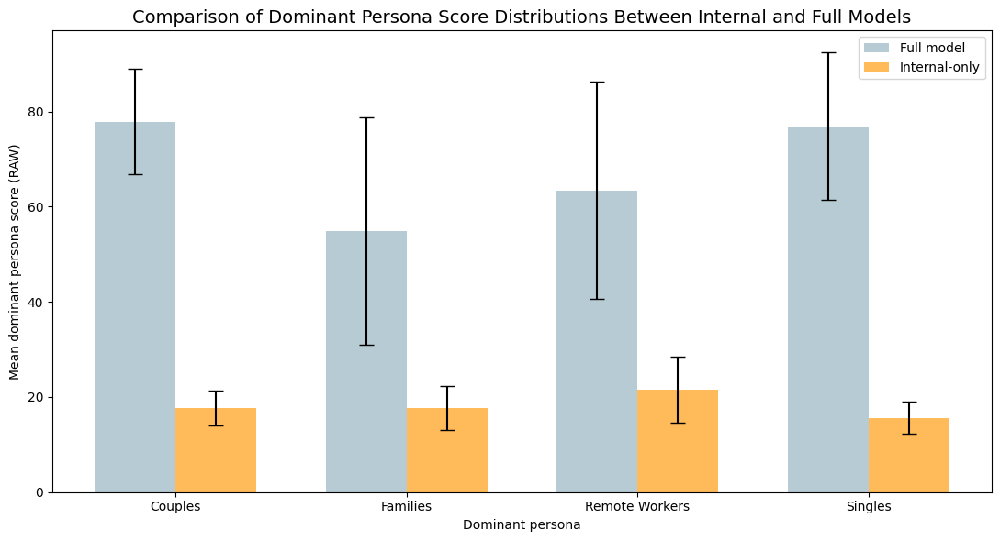

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F

# Input tables 
df_full     = final_display              # Internal + External data
df_internal = final_display_internal     # Internal

# Compute PERSONA SCORE STATS (RAW, dominant)
def compute_stats(df, label):
    return (
        df
        .selectExpr(
            "dominant_persona",
            "greatest(score_singles_raw, score_couples_raw, score_families_raw, score_work_raw) as dominant_score"
        )
        .groupBy("dominant_persona")
        .agg(
            F.avg("dominant_score").alias("mean"),
            F.stddev("dominant_score").alias("stddev"),
            F.variance("dominant_score").alias("variance")
        )
        .withColumn("model", F.lit(label))
    )

stats_full     = compute_stats(df_full, "Full model")
stats_internal = compute_stats(df_internal, "Internal-only")

stats = stats_full.unionByName(stats_internal).collect()

# Organize data for plotting
personas = sorted({r["dominant_persona"] for r in stats})
models   = ["Full model", "Internal-only"]

mean_map = {(r["dominant_persona"], r["model"]): r["mean"] for r in stats}
std_map  = {(r["dominant_persona"], r["model"]): r["stddev"] for r in stats}

colors = {
    "Full model": "#AEC6CF",        # pastel blue
    "Internal-only": "#FFB347",     # pastel orange
}

# Plot: mean ± stddev
x = range(len(personas))
width = 0.35

plt.figure(figsize=(11, 6))

for i, model in enumerate(models):
    means = [mean_map[(p, model)] for p in personas]
    stds  = [std_map[(p, model)] for p in personas]

    plt.bar(
        [v + (i - 0.5) * width for v in x],
        means,
        width=width,
        yerr=stds,
        capsize=6,
        label=model,
        color=colors[model],
        alpha=0.9
    )

plt.xticks(x, personas)
plt.ylabel("Mean dominant persona score (RAW)")
plt.xlabel("Dominant persona")
plt.title(
    "Comparison of Dominant Persona Score Distributions Between Internal and Full Models",
    fontsize=14
)
plt.legend()
plt.tight_layout()
plt.show()  

**Distribution of dominant persona over assets:**

Total Listings Analyzed: 14363
Distribution Table:
  dominant_persona  count  percentage
0         Families   4834   33.655921
1          Singles   3657   25.461255
2   Remote Workers   3336   23.226345
3          Couples   2536   17.656478


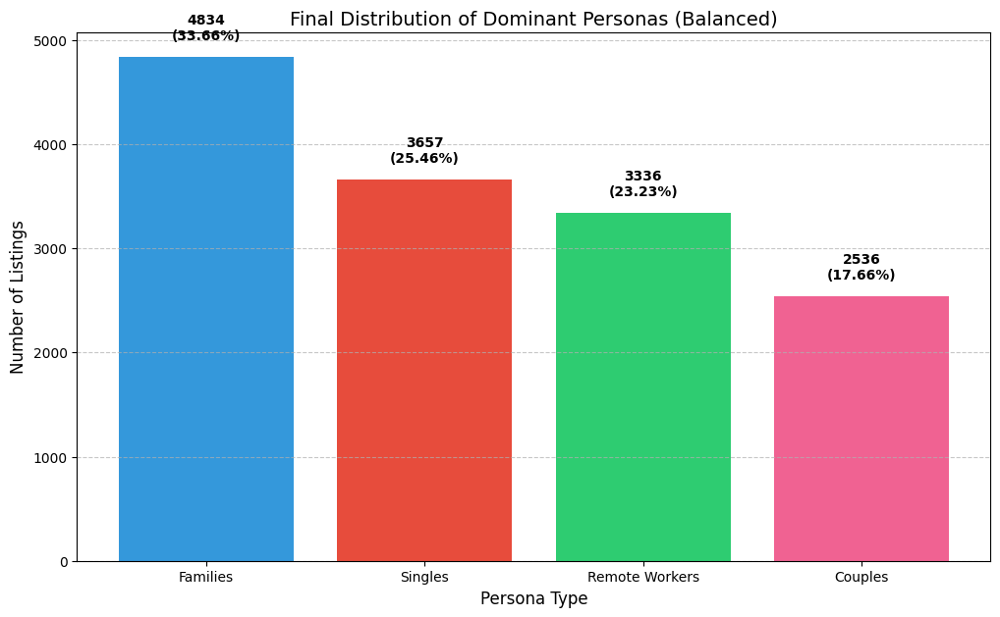

Cleanup complete.


In [0]:
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql import functions as F

# 1. The efficient step: just one fetch from Spark (single job)
# We just count by groups and pass immediately to Pandas
# The result is a tiny 4-row table, so it's very fast
pdf_dist = final_display.groupBy('dominant_persona').count().toPandas()

# 2. Calculations in Python/Pandas (a thousand times faster than running another query in Spark)
total_count = pdf_dist['count'].sum()
pdf_dist['percentage'] = (pdf_dist['count'] / total_count) * 100
pdf_dist = pdf_dist.sort_values('count', ascending=False).reset_index(drop=True)

print(f"Total Listings Analyzed: {total_count}")
print("Distribution Table:")
print(pdf_dist)

#3. Creating the graph (remains almost the same)
plt.figure(figsize=(12, 7))

colors = ['#3498db', '#e74c3c', '#2ecc71', '#f06292'] 
bars = plt.bar(pdf_dist['dominant_persona'], pdf_dist['count'], color=colors)

for i, bar in enumerate(bars):
    yval = bar.get_height()
    # Using iloc to access data safely in Pandas
    percentage = round(pdf_dist.iloc[i]['percentage'], 2)
    plt.text(bar.get_x() + bar.get_width()/2, yval + (total_count*0.01), 
             f'{int(yval)}\n({percentage}%)', 
             va='bottom', ha='center', fontweight='bold')

plt.title('Final Distribution of Dominant Personas (Balanced)', fontsize=14)
plt.xlabel('Persona Type', fontsize=12)
plt.ylabel('Number of Listings', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# 4. Cleaning
nearby_stats.unpersist()
places_clean_df.unpersist()

print("Cleanup complete.")

In [0]:
%pip install folium

  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/b5/a8/5f764f333204db0390362a4356d03a43626997f26818a0e9396f1b3bd8c9/folium-0.20.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for branca>=0.6.0 from https://files.pythonhosted.org/packages/7e/50/fc9680058e63161f2f63165b84c957a0df1415431104c408e8104a3a18ef/branca-0.8.2-py3-none-any.whl.metadata
  Obtaining dependency information for xyzservices from https://files.pythonhosted.org/packages/ef/5c/2c189d18d495dd0fa3f27ccc60762bbc787eed95b9b0147266e72bb76585/xyzservices-2025.11.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/113.4 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.4/113.4 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 0.0/93.9 kB ? eta -:--:--
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.9/93.9 kB 10.2 MB/s eta 0:00:00
Note: you may need to restart the kernel using %restart_python or dbutils.library.r

**Persona Dominance Heatmap by City:**

In [0]:
import folium
from folium.plugins import HeatMap
import pandas as pd

#1. Preparing the data
pdf = final_display.toPandas()

# 2. Settings (Cities and Colors)
city_centers = {
    "Barcelona": [41.3851, 2.1734], "Budapest": [47.4979, 19.0402],
    "Buenos Aires": [-34.6037, -58.3816], "Cape Town": [-33.9249, 18.4241],
    "Lisbon": [38.7223, -9.1393], "Mexico City": [19.4326, -99.1332],
    "Miami": [25.7617, -80.1918], "New York": [40.7128, -74.0060],
    "Paris": [48.8566, 2.3522], "Phuket": [7.8804, 98.3923],
    "San Francisco": [37.7749, -122.4194], "Sao Paulo": [-23.5505, -46.6333],
    "Tel Aviv": [32.0853, 34.7818], "Tiberias": [32.7940, 35.5312],
    "Tokyo": [35.6762, 139.6503]
}

# Color settings for heatmaps (gradients)
heat_layers = {
    'Singles': {
        'gradient': {0.4: '#ff8a80', 0.65: '#ff5252', 1.0: '#d50000'}, # red
        'name': "<span style='color:#d50000; font-weight:bold;'>●</span> Singles"
    },
    'Couples': {
        'gradient': {0.4: '#f48fb1', 0.65: '#ec407a', 1.0: '#880e4f'}, # pink
        'name': "<span style='color:#880e4f; font-weight:bold;'>●</span> Couples"
    },
    'Families': {
        'gradient': {0.4: '#81d4fa', 0.65: '#29b6f6', 1.0: '#01579b'}, # blue
        'name': "<span style='color:#01579b; font-weight:bold;'>●</span> Families"
    },
    'Remote Workers': {
        'gradient': {0.4: '#a5d6a7', 0.65: '#66bb6a', 1.0: '#1b5e20'}, # green
        'name': "<span style='color:#1b5e20; font-weight:bold;'>●</span> Remote Workers"
    }
}

# 3. Creating the map (OpenStreetMap for maximum detail)
m = folium.Map(location=[48.8566, 2.3522], zoom_start=4, tiles='OpenStreetMap')

# 3. Creating the map (OpenStreetMap for maximum detail)
for persona, config in heat_layers.items():
    # Filter the data by the current persona
    data = pdf[pdf['dominant_persona'] == persona][['lat', 'long']].values.tolist()
    
    # Add to map
    HeatMap(
        data,
        name=config['name'],
        min_opacity=0.4,
        radius=18,     
        blur=12,      
        gradient=config['gradient'],
        overlay=True,
        control=True
    ).add_to(m)

#5. Component 1: Removable Persona Filter (LayerControl) 
folium.LayerControl(position='topright', collapsed=True).add_to(m)

#6. Component 2: Removable Cities Menu (Custom HTML)
map_name = m.get_name()
city_buttons_html = "".join([
    f'<div class="city-item" onclick="{map_name}.flyTo({coords}, 13)">{city}</div>'
    for city, coords in sorted(city_centers.items())
])

custom_ui = f"""
<style>
    /* The design of the cities' pull-out button - exactly the same as your code */
    #city-menu-container {{
        position: fixed;
        top: 10px;
        right: 60px; /* Located to the left of the layers button */
        z-index: 1000;
        font-family: 'Segoe UI', sans-serif;
    }}

    /* The round button */
    .menu-button {{
        width: 44px;
        height: 44px;
        background: white;
        border-radius: 4px;
        box-shadow: 0 1px 5px rgba(0,0,0,0.4);
        display: flex;
        align-items: center;
        justify-content: center;
        font-size: 20px;
        cursor: pointer;
        transition: 0.3s;
    }}
    
    .menu-button:hover {{ background: #f4f4f4; }}

    /* The list itself */
    .city-list {{
        display: none;
        position: absolute;
        top: 0;
        right: 50px;
        background: white;
        padding: 10px;
        border-radius: 8px;
        box-shadow: 0 2px 15px rgba(0,0,0,0.2);
        width: 140px;
        max-height: 400px;
        overflow-y: auto;
    }}

    /* Hover mechanism */
    #city-menu-container:hover .city-list {{
        display: block;
    }}

    /* Design the items */
    .city-item {{
        padding: 8px;
        border-bottom: 1px solid #eee;
        cursor: pointer;
        font-size: 13px;
        color: #333;
    }}
    .city-item:hover {{
        background-color: #f0f7ff;
        color: #3498db;
        font-weight: bold;
        border-radius: 4px;
    }}
    .city-item:last-child {{ border-bottom: none; }}
    
    .list-title {{
        font-weight: bold; 
        margin-bottom: 8px; 
        border-bottom: 2px solid #3498db; 
        padding-bottom: 5px;
        font-size: 12px;
        color: #2c3e50;
    }}
</style>

<div id="city-menu-container">
    <div class="menu-button">🌍</div>
    <div class="city-list">
        <div class="list-title">JUMP TO CITY</div>
        {city_buttons_html}
    </div>
</div>
"""

m.get_root().html.add_child(folium.Element(custom_ui))

display(m)

**Persona Zones Map (Clustering + Convex Hull):**

In [0]:
import warnings
import os
import logging
import sys
import contextlib
import io

# 1) GLOBAL SETTINGS (silence warnings & noisy logs)
# Silence Python warnings
os.environ["PYTHONWARNINGS"] = "ignore"
warnings.filterwarnings("ignore")

# Silence Spark / py4j chatter
logging.getLogger("py4j").setLevel(logging.ERROR)

# Utility: temporarily suppress stderr (where threadpoolctl prints its noise)
@contextlib.contextmanager
def suppress_stderr():
    """Temporarily suppress stderr output (e.g., noisy native library traces)."""
    old_stderr = sys.stderr
    try:
        sys.stderr = io.StringIO()
        yield
    finally:
        sys.stderr = old_stderr


import folium
from folium.plugins import MarkerCluster
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from sklearn.cluster import KMeans

# 2) Data preparation 
pdf = final_display.toPandas()

persona_colors = {
    "Singles": "#e74c3c",
    "Couples": "#f06292",
    "Families": "#3498db",
    "Remote Workers": "#2ecc71"
}

city_centers = {
    "Barcelona": [41.3851, 2.1734], "Budapest": [47.4979, 19.0402],
    "Buenos Aires": [-34.6037, -58.3816], "Cape Town": [-33.9249, 18.4241],
    "Lisbon": [38.7223, -9.1393], "Mexico City": [19.4326, -99.1332],
    "Miami": [25.7617, -80.1918], "New York": [40.7128, -74.0060],
    "Paris": [48.8566, 2.3522], "Phuket": [7.8804, 98.3923],
    "San Francisco": [37.7749, -122.4194], "Sao Paulo": [-23.5505, -46.6333],
    "Tel Aviv": [32.0853, 34.7818], "Tiberias": [32.7940, 35.5312],
    "Tokyo": [35.6762, 139.6503]
}

data_cities = pdf["source_city"].dropna().unique()

# 3) Create map + Dynamic clustering
m = folium.Map(location=[48.8566, 2.3522], zoom_start=2, tiles="OpenStreetMap")

# If you later want point clustering too, keep MarkerCluster
# Here you're drawing polygons, so MarkerCluster isn't required.
# Still leaving it out to keep the map lighter.

for city in data_cities:
    city_data = pdf[pdf["source_city"] == city].copy()
    num_listings = len(city_data)

    if num_listings < 5:
        continue

    # Dynamic cluster sizing:
    # 1 cluster per ~50 listings (clamped)
    calculated_clusters = int(num_listings / 50)
    n_clusters = max(5, min(40, calculated_clusters))

    # Protection for small datasets
    if num_listings < n_clusters * 2:
        n_clusters = max(2, int(num_listings / 3))

    # Safety: if still too small for KMeans
    if n_clusters < 2 or num_listings < n_clusters:
        continue

    try:
        # Silence threadpoolctl tracebacks that print to stderr during fit_predict
        with suppress_stderr():
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            city_data["local_cluster"] = kmeans.fit_predict(city_data[["lat", "long"]])

        for cluster_id in range(n_clusters):
            cluster_points = city_data[city_data["local_cluster"] == cluster_id]

            # Need at least 3 unique points for a polygon
            if len(cluster_points[["lat", "long"]].drop_duplicates()) < 3:
                continue

            dominant = cluster_points["dominant_persona"].value_counts().idxmax()
            color = persona_colors.get(dominant, "gray")
            points = cluster_points[["lat", "long"]].values

            try:
                hull = ConvexHull(points, qhull_options="QJ")
                hull_path = points[hull.vertices].tolist()

                folium.Polygon(
                    locations=hull_path,
                    color=color,
                    fill=True,
                    fill_color=color,
                    fill_opacity=0.4,
                    weight=1,
                    popup=folium.Popup(
                        f"<b>{city}</b><br>Zone {cluster_id + 1}<br>{dominant}",
                        max_width=200
                    )
                ).add_to(m)

            except Exception:
                # If hull fails for numerical reasons, skip this cluster
                continue

    except Exception:
        # If clustering fails for any reason, skip city
        continue

# 4) UI: City nav + Legend
map_name = m.get_name()
city_buttons = ""
for city_name in sorted(city_centers.keys()):
    coords = city_centers[city_name]
    city_buttons += f'<button class="city-btn" onclick="{map_name}.flyTo({coords}, 14)">{city_name}</button>'

custom_ui = f"""
<style>
    /* Cities bar */
    #city-nav {{ position: fixed; top: 20px; right: 0; z-index: 9999; display: flex; transform: translateX(180px); transition: 0.3s; }}
    #city-nav:hover {{ transform: translateX(0); }}
    .nav-tag {{ width: 50px; height: 50px; background: #2c3e50; color: white; border-radius: 10px 0 0 10px; display: flex; align-items: center; justify-content: center; cursor: pointer; font-size: 24px; box-shadow: -2px 2px 5px rgba(0,0,0,0.2); }}
    .city-list {{ width: 180px; background: white; padding: 12px; box-shadow: -4px 0 15px rgba(0,0,0,0.2); max-height: 500px; overflow-y: auto; border-bottom-left-radius: 10px; }}
    .city-btn {{ display: block; width: 100%; padding: 10px; margin-bottom: 6px; background: #f8f9fa; border: 1px solid #ddd; border-radius: 6px; cursor: pointer; text-align: left; font-size: 13px; font-weight: 500; transition: 0.2s; }}
    .city-btn:hover {{ background: #e9ecef; border-left: 5px solid #3498db; }}

    /* Legend */
    #legend {{ position: fixed; bottom: 30px; left: 20px; width: 170px; background: rgba(255, 255, 255, 0.95); padding: 15px; border-radius: 10px; box-shadow: 0 0 20px rgba(0,0,0,0.15); z-index: 9999; font-family: 'Segoe UI', sans-serif; }}
    .legend-item {{ margin-bottom: 8px; font-size: 13px; display: flex; align-items: center; color: #333; }}
    .color-box {{ width: 16px; height: 16px; margin-right: 10px; border-radius: 4px; opacity: 0.8; }}
</style>

<div id="city-nav">
    <div class="nav-tag">🗺️</div>
    <div class="city-list">
        <div style="margin-bottom:10px; font-weight:bold; color:#2c3e50; border-bottom:2px solid #3498db; padding-bottom:5px;">
            Select City (Zoom In)
        </div>
        {city_buttons}
    </div>
</div>

<div id="legend">
    <div style="font-weight:bold; margin-bottom:10px; border-bottom:1px solid #eee; font-size:14px;">
        Dominant Persona
    </div>
    <div class="legend-item"><div class="color-box" style="background:#e74c3c;"></div>Singles</div>
    <div class="legend-item"><div class="color-box" style="background:#f06292;"></div>Couples</div>
    <div class="legend-item"><div class="color-box" style="background:#3498db;"></div>Families</div>
    <div class="legend-item"><div class="color-box" style="background:#2ecc71;"></div>Remote Workers</div>
</div>
"""

m.get_root().html.add_child(folium.Element(custom_ui))
display(m)


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run wistful-wasp-438 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/8b2a910548f94531b55fca4591ce5992
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run rambunctious-bee-848 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/0b5c08520c6c4689845f03ae40b9ad98
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run bedecked-foal-35 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/cae08eb07f644b119cba0fcac9cbad8a
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run incongruous-rat-731 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/7286e592d89f43f6a8279aded2b40bed
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run blushing-grouse-245 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/3425d9f4bf6e497b9624cdcf6ddaefd3
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run unequaled-shark-405 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/73ce5b4245434f638e85bfa9d80c68d7
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run polite-yak-145 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/f8dbfb1d4468402bbd16e66fae6374d7
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run efficient-ox-974 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/47818735b0ec43c5b0730bbe9f9ab70a
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run classy-mouse-885 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/8dbe38a3dcce4b609016f0c62851c0bc
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run unleashed-snipe-429 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/5f22c81fbf424146a84662e5e7248b4d
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run unleashed-sponge-796 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/1c2b60d9ea234590ae05ef4e1ab759d3
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run selective-boar-781 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/9fee15111a2646d780c96f6a010ceeb5
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run exultant-horse-106 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/05e67e13532940729b46ca7af614cb1a
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run treasured-wasp-792 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/8f91177e849141679e8e30eb66559088
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run defiant-goat-823 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107/runs/caad6f7f7ef248f6bbcfa58480f2dfe7
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/3680157061074107


**Persona Score Distributions (KDE):**

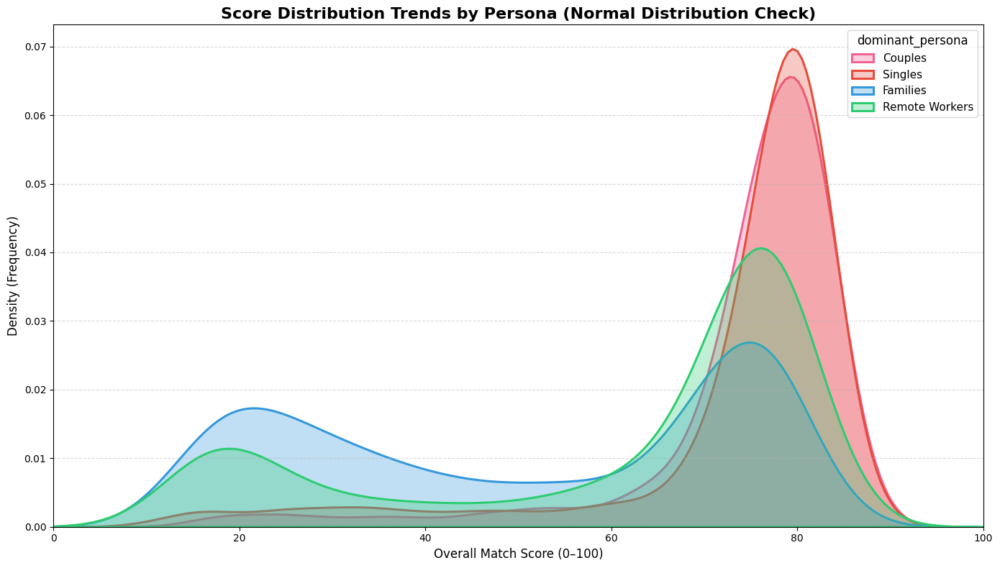

In [0]:
# 5) Score distribution plot — matched to reference figure
plt.figure(figsize=(14, 8))

persona_order = ["Couples", "Singles", "Families", "Remote Workers"]

for persona in persona_order:
    subset = pdf[pdf["dominant_persona"] == persona]

    if len(subset) < 10:
        continue

    sns.kdeplot(
        x=subset["overall_score"],
        fill=True,
        alpha=0.30,
        linewidth=2.2,
        color=persona_colors[persona],
        label=persona,
        bw_adjust=1.1,
        common_norm=False   
    )

plt.title(
    "Score Distribution Trends by Persona (Normal Distribution Check)",
    fontsize=16,
    fontweight="bold"
)
plt.xlabel("Overall Match Score (0–100)", fontsize=12)
plt.ylabel("Density (Frequency)", fontsize=12)

plt.xlim(0, 100)
plt.grid(axis="y", linestyle="--", alpha=0.5)

plt.legend(
    title="dominant_persona",
    fontsize=11,
    title_fontsize=12
)

plt.tight_layout()
plt.show()


**Interactive Persona Map (Sampled Listings):**

In [0]:
import folium
from folium.plugins import MarkerCluster, FeatureGroupSubGroup
import pandas as pd

# 1. Data Preparation (Random Sample 80)
full_pdf = final_display.toPandas()

pdf = full_pdf.groupby('source_city').apply(
    lambda x: x.sample(n=min(len(x), 80), random_state=42)
).reset_index(drop=True)

# 2. Settings (Cities and Colors)
city_centers = {
    "Barcelona": [41.3851, 2.1734], "Budapest": [47.4979, 19.0402],
    "Buenos Aires": [-34.6037, -58.3816], "Cape Town": [-33.9249, 18.4241],
    "Lisbon": [38.7223, -9.1393], "Mexico City": [19.4326, -99.1332],
    "Miami": [25.7617, -80.1918], "New York": [40.7128, -74.0060],
    "Paris": [48.8566, 2.3522], "Phuket": [7.8804, 98.3923],
    "San Francisco": [37.7749, -122.4194], "Sao Paulo": [-23.5505, -46.6333],
    "Tel Aviv": [32.0853, 34.7818], "Tiberias": [32.7940, 35.5312],
    "Tokyo": [35.6762, 139.6503]
}

persona_colors = {
    'Singles': '#e74c3c',       # red
    'Couples': '#f06292',       # pink
    'Families': '#3498db',      # blue
    'Remote Workers': '#2ecc71' # green
}

# 3. Creating the map
# Changing the map name from cartodbpositron to something neutral ('Base Map') so that the strange name doesn't appear
m = folium.Map(location=[48.8566, 2.3522], zoom_start=4)
folium.TileLayer('CartoDB positron', name='Base Map').add_to(m)

# MarkerCluster
mcg = MarkerCluster(control=False, options={'disableClusteringAtZoom': 16}).add_to(m)

# Creating layers for the filter (with colored circles named)
groups = {}
for persona, color in persona_colors.items():
    # The name that will appear inside the pull-down bar
    group_name = f"<span style='color:{color}; font-size:14px;'>●</span> {persona}"
    groups[persona] = FeatureGroupSubGroup(mcg, name=group_name).add_to(m)

#4. Adding the dots
for _, row in pdf.iterrows():
    persona = row['dominant_persona']
    color = persona_colors.get(persona, 'gray')
    
    html = f"""
    <div style="font-family: 'Segoe UI', sans-serif; width: 260px;">
        <h4 style="margin: 0; color: #2c3e50; border-bottom: 2px solid {color}; padding-bottom: 5px;">
            {row['listing_name'][:30]}...
        </h4>
        <div style="margin-top: 10px; font-size: 13px;">
            <div style="display:flex; justify-content:space-between;"><span>❤️ Couples:</span><b>{row['score_couples']:.1f}</b></div>
            <div style="display:flex; justify-content:space-between;"><span>🍸 Singles:</span><b>{row['score_singles']:.1f}</b></div>
            <div style="display:flex; justify-content:space-between;"><span>👨‍👩‍👧 Families:</span><b>{row['score_families']:.1f}</b></div>
            <div style="display:flex; justify-content:space-between;"><span>💻 Remote:</span><b>{row['score_work']:.1f}</b></div>
        </div>
        <div style="background-color: #f8f9fa; padding: 5px; margin-top: 10px; text-align: center;">
            <span style="color: #7f8c8d; font-size: 11px;">Dominant Persona</span><br>
            <b style="color: {color}; font-size: 14px;">{persona.upper()}</b>
        </div>
        <a href="{row['url']}" target="_blank" style="display: block; margin-top: 12px; background-color: {color}; color: white; text-align: center; padding: 8px; text-decoration: none; border-radius: 4px; font-weight: bold; font-size: 12px;">View on Airbnb →</a>
    </div>
    """

    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=6, color=color, fill=True, fill_color=color, fill_opacity=0.8,
        popup=folium.Popup(html, max_width=300),
        tooltip=f"{persona}: {row['overall_score']:.1f}"
    ).add_to(groups[persona])

# 5. Component 1: Persona Filter (LayerControl)
# collapsed=True makes it an icon that only opens on hover
folium.LayerControl(position='topright', collapsed=True).add_to(m)

#6. Component 2: Removable Cities Menu (Custom HTML)
map_name = m.get_name()
city_buttons_html = "".join([
    f'<div class="city-item" onclick="{map_name}.flyTo({coords}, 13)">{city}</div>'
    for city, coords in sorted(city_centers.items())
])

custom_ui = f"""
<style>
    /* Design the removable button of the cities */
    #city-menu-container {{
        position: fixed;
        top: 10px;
        right: 60px; 
        z-index: 1000;
        font-family: 'Segoe UI', sans-serif;
    }}

    /* The round button you see at the beginning */
    .menu-button {{
        width: 44px;
        height: 44px;
        background: white;
        border-radius: 4px; 
        box-shadow: 0 1px 5px rgba(0,0,0,0.4);
        display: flex;
        align-items: center;
        justify-content: center;
        font-size: 20px;
        cursor: pointer;
        transition: 0.3s;
    }}
    
    .menu-button:hover {{ background: #f4f4f4; }}

    /* The list itself (hidden at first) */
    .city-list {{
        display: none;
        position: absolute;
        top: 0;
        right: 50px; 
        background: white;
        padding: 10px;
        border-radius: 8px;
        box-shadow: 0 2px 15px rgba(0,0,0,0.2);
        width: 140px;
        max-height: 400px;
        overflow-y: auto;
    }}

    /* Hover mechanism */
    #city-menu-container:hover .city-list {{
        display: block; 
    }}

    /* Format the items in the list */
    .city-item {{
        padding: 8px;
        border-bottom: 1px solid #eee;
        cursor: pointer;
        font-size: 13px;
        color: #333;
    }}
    .city-item:hover {{
        background-color: #f0f7ff;
        color: #3498db;
        font-weight: bold;
        border-radius: 4px;
    }}
    .city-item:last-child {{ border-bottom: none; }}
    
    .list-title {{
        font-weight: bold; 
        margin-bottom: 8px; 
        border-bottom: 2px solid #3498db; 
        padding-bottom: 5px;
        font-size: 12px;
        color: #2c3e50;
    }}
</style>

<div id="city-menu-container">
    <div class="menu-button">🌍</div>
    <div class="city-list">
        <div class="list-title">JUMP TO CITY</div>
        {city_buttons_html}
    </div>
</div>
"""

m.get_root().html.add_child(folium.Element(custom_ui))
display(m)

*Thank You (:*